In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm

from pytensor import tensor as at
from matplotlib.patches import Ellipse, transforms
from scipy import stats

In [2]:
%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action="ignore", category=(FutureWarning, UserWarning))
RANDOM_SEED = 8927
np.random.seed(RANDOM_SEED)
az.style.use("arviz-darkgrid")
az.rcParams["stats.hdi_prob"] = 0.89
az.rcParams["stats.ic_scale"] = "deviance"
az.rcParams["stats.information_criterion"] = "waic"

In [3]:
def standardize(series):
    """Standardize a pandas series"""
    return (series - series.mean()) / series.std()

#### Code 14.1

In [89]:
a = 3.5  # average morning wait time
b = -1.0  # average difference afternoon wait time
sigma_a = 1.0  # std dev in intercepts
sigma_b = 0.5  # std dev in slopes
rho = -0.7  # correlation between intercepts and slopes

#### Code 14.2

In [90]:
Mu = [a, b]

#### Code 14.3

In [91]:
cov_ab = sigma_a * sigma_b * rho
Sigma = np.array([[sigma_a**2, cov_ab], [cov_ab, sigma_b**2]])
Sigma

array([[ 1.  , -0.35],
       [-0.35,  0.25]])

#### Code 14.4
R related and not relevant for Python.

#### Code 14.5

In [92]:
sigmas = [sigma_a, sigma_b]
Rho = np.matrix([[1, rho], [rho, 1]])

Sigma = np.diag(sigmas) * Rho * np.diag(sigmas)
Sigma

matrix([[ 1.  , -0.35],
        [-0.35,  0.25]])

#### Code 14.6

In [93]:
N_cafes = 20

#### Code 14.7

In [94]:
vary_effects = np.random.multivariate_normal(mean=Mu, cov=Sigma, size=N_cafes)

#### Code 14.8

In [95]:
a_cafe = vary_effects[:, 0]
b_cafe = vary_effects[:, 1]

#### Code 14.9

In [96]:
def Gauss2d(mu, cov, ci, ax=None):
    """Copied from statsmodel"""
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 6))

    v_, w = np.linalg.eigh(cov)
    u = w[0] / np.linalg.norm(w[0])
    angle = np.arctan(u[1] / u[0])
    angle = 180 * angle / np.pi  # convert to degrees

    for level in ci:
        v = 2 * np.sqrt(v_ * stats.chi2.ppf(level, 2))  # get size corresponding to level
        ell = Ellipse(
            mu[:2],
            v[0],
            v[1],
            angle=180 + angle,
            facecolor="None",
            edgecolor="k",
            alpha=(1 - level) * 0.5,
            lw=1.5,
        )
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)
        ax.add_artist(ell)

    return ax

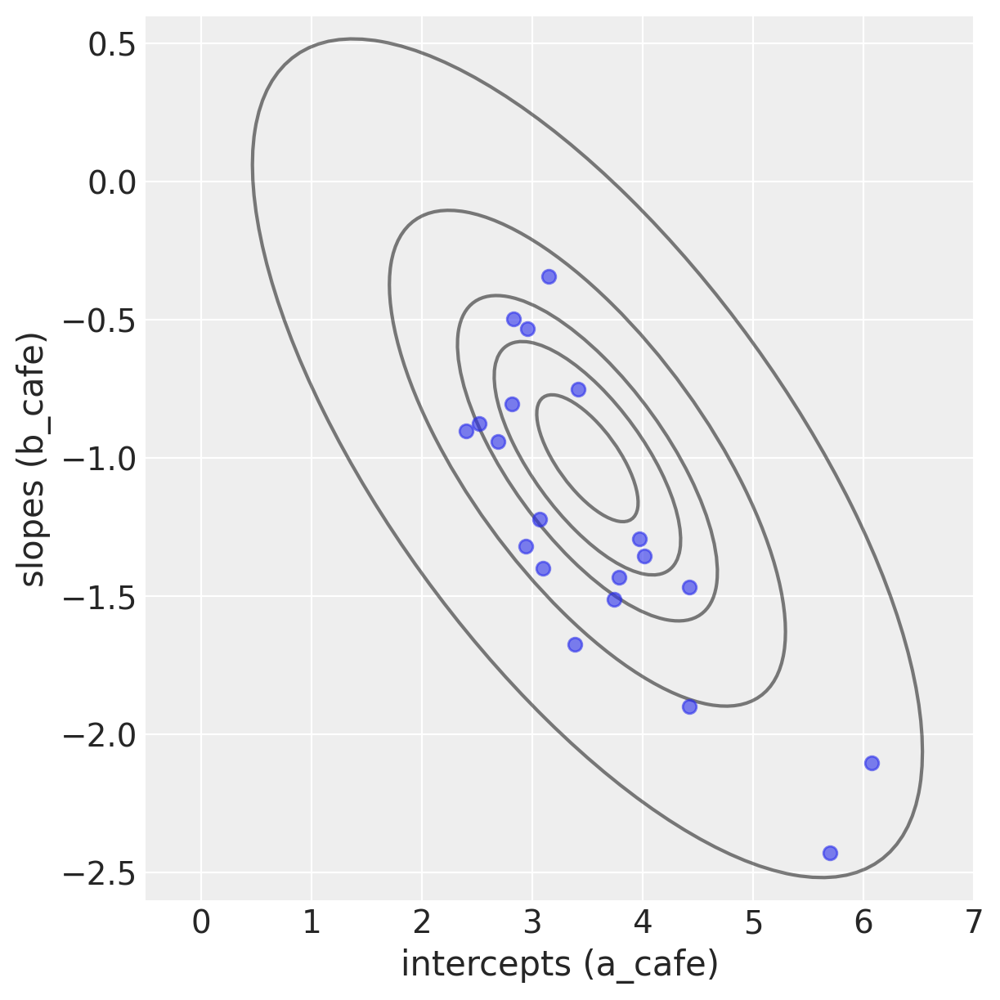

In [97]:
ax = Gauss2d(Mu, np.asarray(Sigma), [0.1, 0.3, 0.5, 0.8, 0.99])
ax.scatter(a_cafe, b_cafe, alpha=0.6)
ax.set_xlim(-0.5, 7)
ax.set_ylim(-2.6, 0.6)
ax.set_xlabel("intercepts (a_cafe)")
ax.set_ylabel("slopes (b_cafe)");

#### Code 14.10

In [98]:
N_visits = 10
afternoon = np.tile([0, 1], N_visits * N_cafes // 2)  # wrap with int() to suppress warnings
cafe_id = np.repeat(np.arange(0, N_cafes), N_visits)  # 1-20 (minus 1 for python indexing)

mu = a_cafe[cafe_id] + b_cafe[cafe_id] * afternoon
sigma = 0.5  # std dev within cafes

wait = np.random.normal(loc=mu, scale=sigma, size=N_visits * N_cafes)
d = pd.DataFrame(dict(cafe=cafe_id, afternoon=afternoon, wait=wait))
d

,cafe,afternoon,wait
0,0,0,4.699199
1,0,1,2.514123
2,0,0,4.392369
3,0,1,2.638416
4,0,0,4.793517
...,...,...,...
195,19,1,1.441517
196,19,0,2.358307
197,19,1,0.429003
198,19,0,2.058056


#### Code 14.11

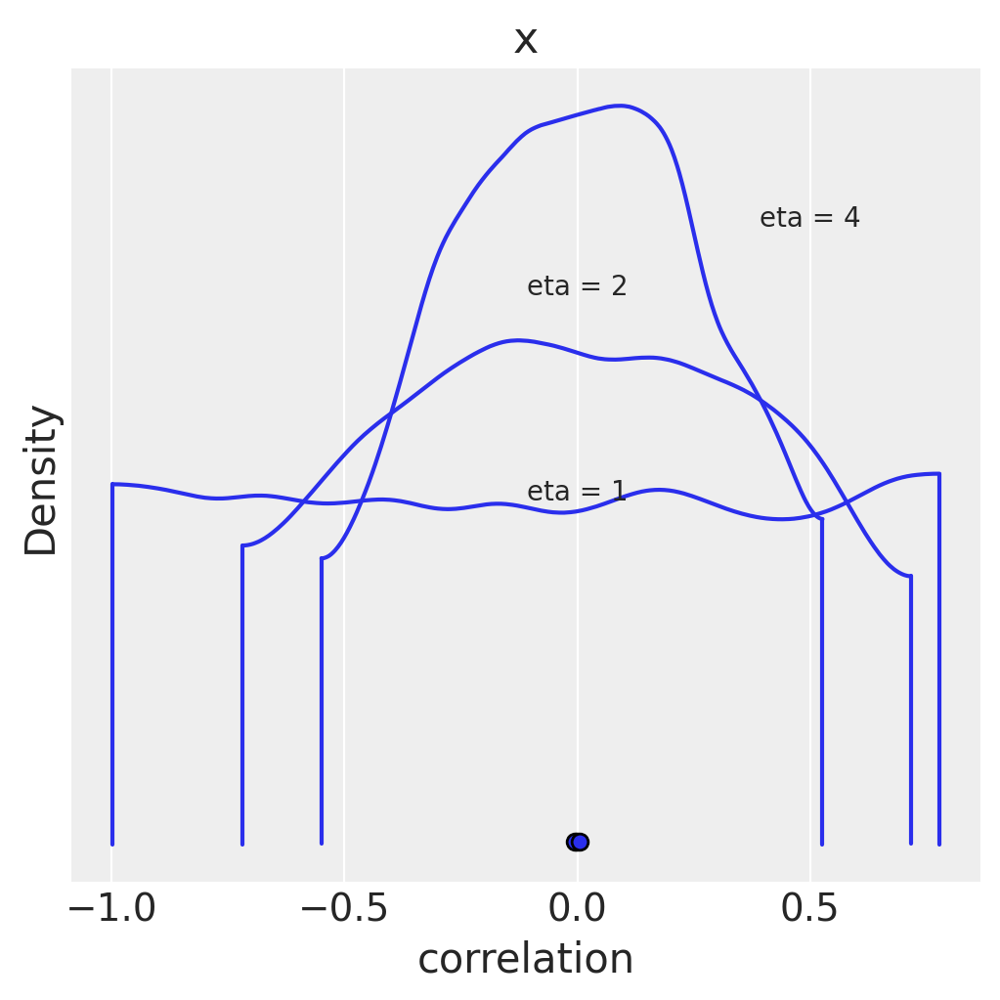

In [99]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))
textloc = [[0, 0.5], [0, 0.8], [0.5, 0.9]]

for eta, loc in zip([1, 2, 4], textloc):
    R = pm.LKJCorr.dist(n=2, eta=eta, size=10000).eval()
    az.plot_density(R, ax=ax, backend_kwargs={"alpha": 0.8})
    ax.text(loc[0], loc[1], "eta = %s" % (eta), horizontalalignment="center")

ax.set_xlabel("correlation")
ax.set_ylabel("Density");

#### Code 14.12

In [103]:
cafe_idx = d["cafe"].values
with pm.Model() as m14_1:
    # LKJCholeskyCov is more efficient than LKJCorr
    # PyMC >= 3.9 extracts the stds and matrix of correlations automatically for us
    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
    )

    a = pm.Normal("a", 5.0, 2.0)  # prior for average intercept
    b = pm.Normal("b", -1.0, 0.5)  # prior for average slope
    ab_cafe = pm.MvNormal(
        "ab_cafe", mu=at.stack([a, b]), chol=chol, shape=(N_cafes, 2)
    )  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe

    mu = ab_cafe[cafe_idx, 0] + ab_cafe[cafe_idx, 1] * d["afternoon"].values  # linear model
    sigma_within = pm.Exponential("sigma_within", 1.0)  # prior stddev within cafes

    wait = pm.Normal("wait", mu=mu, sigma=sigma_within, observed=d["wait"].values)  # likelihood

    trace_14_1 = pm.sample(4000, tune=4000, target_accept=0.9, idata_kwargs={"log_likelihood": True})
    trace_14_1.rename({"chol_cov_corr": "Rho", "chol_cov_stds": "sigma_cafe"}, inplace=True)

post = trace_14_1.posterior

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_cafe, sigma_within]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 53 seconds.


In [104]:
az.waic(trace_14_1)

Computed from 16000 posterior samples and 200 observations log-likelihood matrix.

              Estimate       SE
deviance_waic   337.00    20.84
p_waic           31.74        -

There has been a warning during the calculation. Please check the results.

For complex models it is always good to do more checks:

In [16]:
az.summary(trace_14_1, var_names=["a", "b", "sigma_within", "Rho", "sigma_cafe"], round_to=2)

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,3.29,0.20,2.96,3.60,0.0,0.0,17573.66,13121.84,1.0
b,-0.98,0.12,-1.17,-0.79,0.0,0.0,14771.26,12592.55,1.0
sigma_within,0.55,0.03,0.50,0.60,0.0,0.0,16112.86,11545.39,1.0
"Rho[0, 0]",1.00,0.00,1.00,1.00,0.0,NaN,16000.00,16000.00,NaN
"Rho[0, 1]",-0.54,0.20,-0.86,-0.25,0.0,0.0,12498.16,10067.19,1.0
"Rho[1, 0]",-0.54,0.20,-0.86,-0.25,0.0,0.0,12498.16,10067.19,1.0
"Rho[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,15831.99,16000.00,1.0
sigma_cafe[0],0.89,0.15,0.65,1.12,0.0,0.0,17332.30,12866.24,1.0
sigma_cafe[1],0.43,0.12,0.24,0.62,0.0,0.0,4765.82,4813.53,1.0


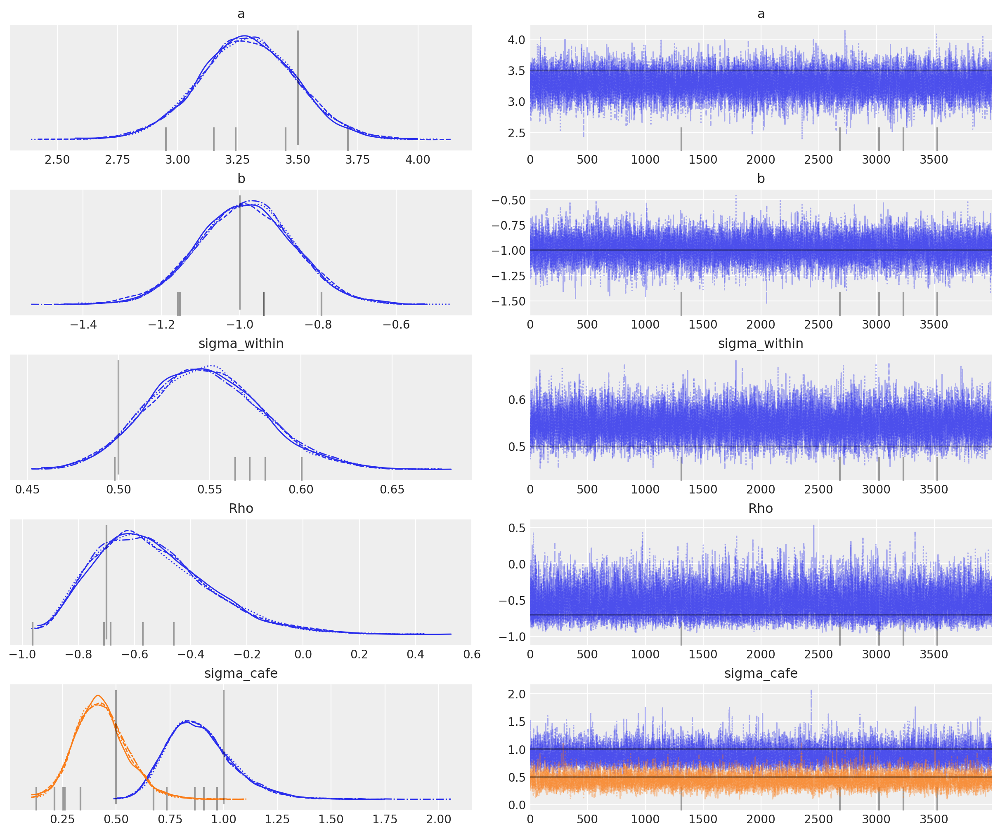

In [17]:
az.plot_trace(
    trace_14_1,
    compact=True,
    var_names=["~ab_cafe", "~chol_cov"],
    coords={"chol_cov_corr_dim_0": 1, "chol_cov_corr_dim_1": 0},
    lines=[
        ("a", {}, Mu[0]),
        ("b", {}, Mu[1]),
        ("sigma_cafe", {}, sigmas),
        ("Rho", {}, Rho[0, 1]),
        ("sigma_within", {}, sigma),
    ],
);

#### Code 14.13

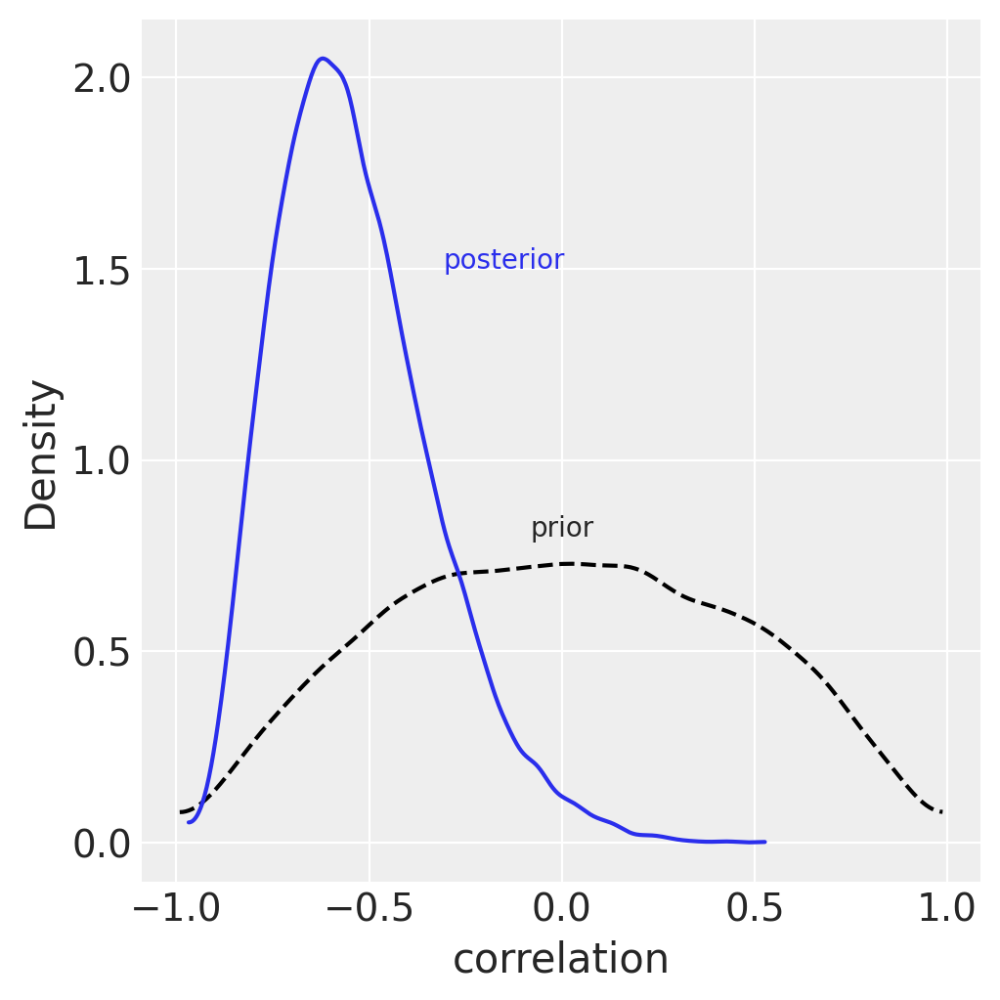

In [18]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))

R = pm.LKJCorr.dist(n=2, eta=2, size=10000).eval()
az.plot_kde(R, plot_kwargs={"color": "k", "linestyle": "--"})
ax.text(0, 0.8, "prior", horizontalalignment="center")

az.plot_kde(
    np.array(
        az.extract_dataset(post["Rho"].sel(chol_cov_corr_dim_0=1, chol_cov_corr_dim_1=0)).to_array()
    ),
    ax=ax,
    plot_kwargs={"color": "C0"},
)
ax.text(-0.15, 1.5, "posterior", color="C0", horizontalalignment="center")

ax.set_xlabel("correlation")
ax.set_ylabel("Density");

#### Code 14.14 and 14.15

In [19]:
# compute unpooled estimates directly from data
a1b1 = d.groupby(["afternoon", "cafe"]).agg("mean").unstack(level=0).values
a1 = a1b1[:, 0]
b1 = a1b1[:, 1] - a1

# extract posterior means of partially pooled estimates
a2b2 = post["ab_cafe"].mean(dim=("chain", "draw"))
a2 = a2b2[:, 0]
b2 = a2b2[:, 1]

# compute posterior mean bivariate Gaussian
ab = post[["a", "b"]].mean(dim=("chain", "draw"))
Mu_est = np.array([ab["a"], ab["b"]])
chol_model = pm.expand_packed_triangular(
    2, post["chol_cov"].mean(dim=("chain", "draw")).to_numpy(), lower=True
).eval()
Sigma_est = np.dot(chol_model, chol_model.T)

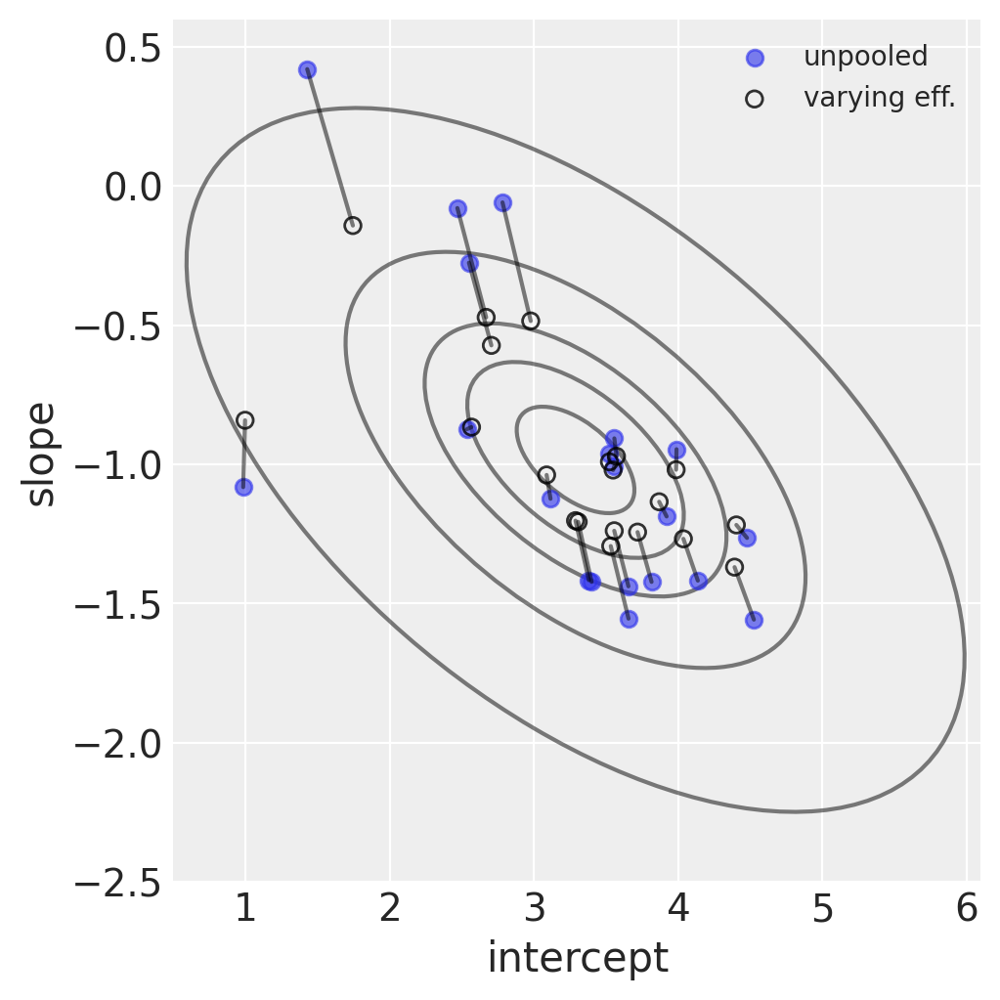

In [20]:
# draw contours
_, ax = plt.subplots(1, 1, figsize=(5, 5))
_ = Gauss2d(mu=Mu_est, cov=np.asarray(Sigma_est), ci=[0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)

# plot both and connect with lines
ax.scatter(a1, b1, label="unpooled", alpha=0.6)
ax.scatter(a2, b2, label="varying eff.", facecolors="none", edgecolors="k", lw=1, alpha=0.8)

ax.plot([a1, a2], [b1, b2], "k-", alpha=0.5)
ax.set_xlabel("intercept")
ax.set_ylabel("slope")
ax.set_xlim(0.5, 6.1)
ax.set_ylim(-2.5, 0.6)
plt.legend(fontsize=10);

#### Code 14.16 and 14.17

In [21]:
# convert varying effects to waiting times
wait_morning_1 = a1
wait_afternoon_1 = a1 + b1
wait_morning_2 = a2
wait_afternoon_2 = a2 + b2

# now shrinkage distribution by simulation
v = np.random.multivariate_normal(mean=Mu_est, cov=Sigma_est, size=1000)
v[:, 1] = v[:, 0] + v[:, 1]  # calculate afternoon wait
Sigma_est2 = np.cov(v.T)
Mu_est2 = Mu_est.copy()
Mu_est2[1] = Mu_est[0] + Mu_est[1]

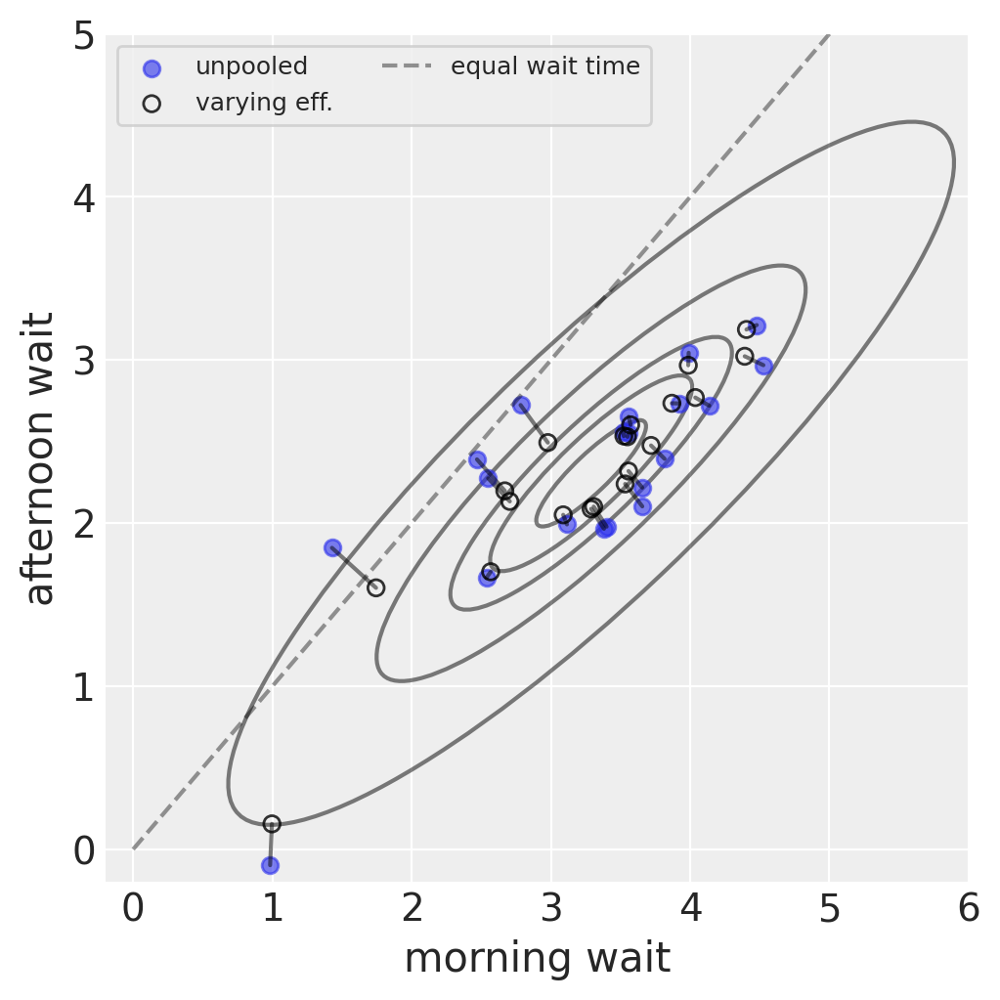

In [22]:
# draw contours
_, ax = plt.subplots(1, 1, figsize=(5, 5))
_ = Gauss2d(mu=Mu_est2, cov=np.asarray(Sigma_est2), ci=[0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)

# plot both and connect with lines
ax.scatter(wait_morning_1, wait_afternoon_1, label="unpooled", alpha=0.6)
ax.scatter(
    wait_morning_2,
    wait_afternoon_2,
    label="varying eff.",
    facecolors="none",
    edgecolors="k",
    lw=1,
    alpha=0.8,
)

ax.plot(
    [wait_morning_1, wait_morning_2],
    [wait_afternoon_1, wait_afternoon_2],
    "k-",
    alpha=0.5,
)
ax.plot(range(6), range(6), "k--", label="equal wait time", alpha=0.4)
ax.set_xlabel("morning wait")
ax.set_ylabel("afternoon wait")
ax.set_xlim(-0.2, 6)
ax.set_ylim(-0.2, 5)
plt.legend(fontsize=9, ncol=2, loc="upper left", frameon=True);

#### Code 14.18

In [23]:
d = pd.read_csv("Data/chimpanzees.csv", sep=";")

d["treatment"] = d.prosoc_left + 2 * d.condition
tid_ = d.treatment.values
Ntreatments = len(np.unique(tid_))

d["actor"] = d.actor - 1
actor_ = d.actor.astype(int).values
Nactors = len(np.unique(actor_))

d["block"] = d.block - 1
block_id_ = d.block.astype(int).values
Nblocks = len(np.unique(block_id_))

In [24]:
with pm.Model() as m14_2:
    # fixed priors
    g = pm.Normal("g", 0.0, 1.0, shape=Ntreatments)
    sd_dist = pm.Exponential.dist(1.0)
    chol_actor, _, _ = pm.LKJCholeskyCov(
        "chol_actor", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    chol_block, _, _ = pm.LKJCholeskyCov(
        "chol_block", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )

    # adaptive priors
    alpha = pm.MvNormal("alpha", mu=0.0, chol=chol_actor, shape=(Nactors, Ntreatments))
    beta = pm.MvNormal("beta", mu=0.0, chol=chol_block, shape=(Nblocks, Ntreatments))

    # for posterior predictions
    actor = pm.Data("actor", actor_, mutable=True)
    block_id = pm.Data("block_id", block_id_, mutable=True)
    tid = pm.Data("tid", tid_, mutable=True)

    p = pm.math.invlogit(g[tid] + alpha[actor, tid] + beta[block_id, tid])
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_14_2 = pm.sample(2000, tune=2000, random_seed=RANDOM_SEED)
    trace_14_2.rename(
        {
            "chol_actor_corr": "Rho_actor",
            "chol_actor_stds": "sigma_actor",
            "chol_block_corr": "Rho_block",
            "chol_block_stds": "sigma_block",
        },
        inplace=True,
    )

Initializing NUTS using jitter+adapt_diag...
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [g, chol_actor, chol_block, alpha, beta]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 104 seconds.
There were 653 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


#### Code 14.19

In [25]:
with pm.Model() as m14_3:
    # fixed priors
    g = pm.Normal("g", 0.0, 1.0, shape=Ntreatments)
    sd_dist = pm.Exponential.dist(1.0)
    chol_actor, _, _ = pm.LKJCholeskyCov(
        "chol_actor", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    chol_block, _, _ = pm.LKJCholeskyCov(
        "chol_block", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )

    # adaptive priors non-centered
    z_actor = pm.Normal("z_actor", 0.0, 1.0, shape=(Ntreatments, Nactors))
    alpha = pm.Deterministic("alpha", pm.math.dot(chol_actor, z_actor))
    z_block = pm.Normal("z_block", 0.0, 1.0, shape=(Ntreatments, Nblocks))
    beta = pm.Deterministic("beta", pm.math.dot(chol_block, z_block))

    # for posterior predictions
    actor = pm.Data("actor", actor_, mutable=True)
    block_id = pm.Data("block_id", block_id_, mutable=True)
    tid = pm.Data("tid", tid_, mutable=True)

    p = pm.Deterministic("p", pm.math.invlogit(g[tid] + alpha[tid, actor] + beta[tid, block_id]))
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_14_3 = pm.sample(4000, tune=4000, target_accept=0.9, random_seed=RANDOM_SEED)
    trace_14_3.rename(
        {
            "chol_actor_corr": "Rho_actor",
            "chol_actor_stds": "sigma_actor",
            "chol_block_corr": "Rho_block",
            "chol_block_stds": "sigma_block",
        },
        inplace=True,
    )

Initializing NUTS using jitter+adapt_diag...
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [g, chol_actor, chol_block, z_actor, z_block]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 90 seconds.


#### Code 14.20

In [26]:
m_14_2 = az.summary(trace_14_2, var_names=["alpha", "beta"], kind="diagnostics", round_to=2)[
    "ess_bulk"
]
m_14_2.name = "m14_2"

m_14_3 = az.summary(trace_14_3, var_names=["alpha", "beta"], kind="diagnostics", round_to=2)[
    "ess_bulk"
]
m_14_3.name = "m14_3"

ess_mean = pd.concat([m_14_2, m_14_3], axis=1, sort=True)

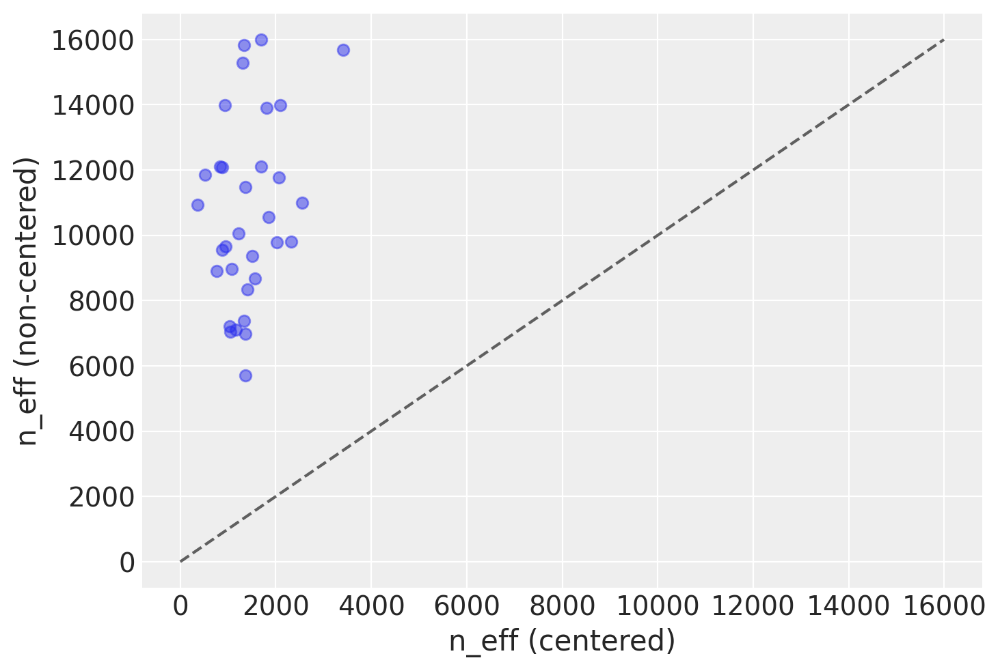

In [27]:
plt.plot(ess_mean.m14_2.values, ess_mean.m14_3.values, "o", alpha=0.5)

max_val = ess_mean.max().max()
plt.plot(np.arange(max_val), np.arange(max_val), "k--", alpha=0.6)

plt.xlabel("n_eff (centered)")
plt.ylabel("n_eff (non-centered)");

#### Code 14.21

In [28]:
az.summary(trace_14_3, var_names="sigma", filter_vars="like", round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_actor[0],1.41,0.50,0.70,2.14,0.01,0.01,5556.66,8134.06,1.0
sigma_actor[1],0.91,0.42,0.30,1.49,0.01,0.01,5640.22,6141.78,1.0
sigma_actor[2],1.87,0.59,0.98,2.67,0.01,0.01,7315.10,9403.31,1.0
sigma_actor[3],1.58,0.60,0.69,2.40,0.01,0.01,6550.61,7493.16,1.0
sigma_block[0],0.40,0.32,0.00,0.79,0.00,0.00,6194.13,6332.35,1.0
sigma_block[1],0.43,0.34,0.01,0.85,0.01,0.01,3384.75,3116.50,1.0
sigma_block[2],0.31,0.27,0.00,0.64,0.01,0.01,2606.55,4040.20,1.0
sigma_block[3],0.49,0.38,0.01,0.96,0.01,0.01,1911.25,1983.90,1.0


#### Code 14.22

In [29]:
# compute mean for each actor in each treatment
pl = d.groupby(["actor", "treatment"]).agg("mean")["pulled_left"].unstack()
pl_val = pl.stack().values
pl

treatment,0,1,2,3
actor,,,,
0,0.333333,0.500000,0.277778,0.555556
1,1.000000,1.000000,1.000000,1.000000
2,0.277778,0.611111,0.166667,0.333333
3,0.333333,0.500000,0.111111,0.444444
4,0.333333,0.555556,0.277778,0.500000
5,0.777778,0.611111,0.555556,0.611111
6,0.777778,0.833333,0.944444,1.000000


In [30]:
# generate posterior predictions
with m14_3:
    pm.set_data(
        {
            "actor": np.repeat(range(7), 4),
            "block_id": np.repeat(4, 4 * 7),
            "tid": list(range(4)) * 7,
        }
    )
    post_pred = pm.sample_posterior_predictive(trace_14_3, random_seed=RANDOM_SEED, var_names="p")
    p_post = post_pred["posterior_predictive"]["p"]
p_mu = np.array(p_post.mean(dim=["chain", "draw"])).reshape((7, 4))

Sampling: []


Output()

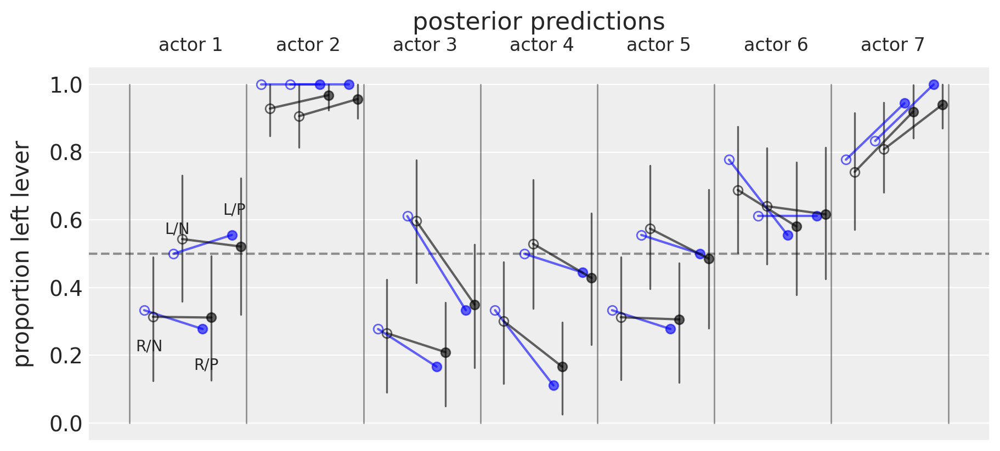

In [31]:
# set up plot
_, ax = plt.subplots(1, 1, figsize=(9, 4), constrained_layout=True)
alpha, xoff, yoff = 0.6, 0.3, 0.06

ax.plot(
    [np.arange(28) + xoff, np.arange(28) + xoff],
    np.array(az.hdi(p_post).to_array())[0].T,
    "k-",
    lw=1.2,
    alpha=alpha,
)
ax.plot([7 * 4 - 0.5] * 2, [0, 1], c="k", alpha=0.4, lw=1)
ax.axhline(0.5, ls="--", c="k", alpha=0.4)

for actor in range(Nactors):
    # raw data
    ax.plot(
        [actor * 4, actor * 4 + 2],
        [pl.loc[actor, 0], pl.loc[actor, 2]],
        "-",
        c="b",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 1, actor * 4 + 3],
        [pl.loc[actor, 1], pl.loc[actor, 3]],
        "-",
        c="b",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4, actor * 4 + 1],
        [pl.loc[actor, 0], pl.loc[actor, 1]],
        "o",
        c="b",
        fillstyle="none",
        ms=6,
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 2, actor * 4 + 3],
        [pl.loc[actor, 2], pl.loc[actor, 3]],
        "o",
        c="b",
        ms=6,
        alpha=alpha,
    )
    # posterior predictions
    ax.plot(
        [actor * 4 + xoff, actor * 4 + 2 + xoff],
        [p_mu[actor, 0], p_mu[actor, 2]],
        "-",
        c="k",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 1 + xoff, actor * 4 + 3 + xoff],
        [p_mu[actor, 1], p_mu[actor, 3]],
        "-",
        c="k",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + xoff, actor * 4 + 1 + xoff],
        [p_mu[actor, 0], p_mu[actor, 1]],
        "o",
        c="k",
        fillstyle="none",
        ms=6,
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 2 + xoff, actor * 4 + 3 + xoff],
        [p_mu[actor, 2], p_mu[actor, 3]],
        "o",
        c="k",
        ms=6,
        alpha=alpha,
    )
    ax.plot([actor * 4 - 0.5] * 2, [0, 1], c="k", alpha=0.4, lw=1)
    ax.text(actor * 4 + 0.5, 1.1, f"actor {actor + 1}", fontsize=12)

    if actor == 0:
        ax.text(actor * 4 - xoff, pl.loc[actor, 0] - 2 * yoff, "R/N")
        ax.text(actor * 4 + 1 - xoff, pl.loc[actor, 1] + yoff, "L/N")
        ax.text(actor * 4 + 2 - xoff, pl.loc[actor, 2] - 2 * yoff, "R/P")
        ax.text(actor * 4 + 3 - xoff, pl.loc[actor, 3] + yoff, "L/P")

ax.set_xticks([])
ax.set_ylabel("proportion left lever", labelpad=10)
ax.set_title("posterior predictions", pad=25);

#### Code 14.23

In [32]:
N = 500
U_sim = np.random.normal(size=N)
Q_sim = np.random.randint(1, 5, N)
E_sim = np.random.normal(loc=U_sim + Q_sim, size=N)
W_sim = np.random.normal(loc=U_sim + 0 * E_sim, size=N)
dat_sim = pd.DataFrame.from_dict(
    {"W": standardize(W_sim), "E": standardize(E_sim), "Q": standardize(Q_sim)}
)
dat_sim.head()

,W,E,Q
0,0.604595,-1.288176,-1.353594
1,-1.706863,-1.664662,-1.353594
2,0.162489,1.263041,0.413500
3,-2.134704,-0.376008,0.413500
4,0.717056,0.212956,0.413500


#### Code 14.24

In [33]:
with pm.Model() as m14_4:
    aW = pm.Normal("aW", 0.0, 0.2)
    bEW = pm.Normal("bEW", 0.0, 0.5)

    mu = aW + bEW * dat_sim.E.values
    sigma = pm.Exponential("sigma", 1.0)

    W_obs = pm.Data("W_obs", dat_sim.W.values, mutable=True)
    W = pm.Normal("W", mu, sigma, observed=W_obs)

    trace_14_4 = pm.sample(random_seed=RANDOM_SEED)
az.summary(trace_14_4, round_to=2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,-0.00,0.04,-0.06,0.06,0.0,0.0,5962.12,3105.74,1.0
bEW,0.43,0.04,0.36,0.49,0.0,0.0,6277.69,2854.90,1.0
sigma,0.91,0.03,0.86,0.95,0.0,0.0,5899.69,3153.49,1.0


#### Code 14.25

In [34]:
with pm.Model() as m14_5:
    aW = pm.Normal("aW", 0.0, 0.2)
    bEW = pm.Normal("bEW", 0.0, 0.5)
    bQW = pm.Normal("bQW", 0.0, 0.5)

    mu = aW + bEW * dat_sim.E.values + bQW * dat_sim.Q.values
    sigma = pm.Exponential("sigma", 1.0)

    W = pm.Normal("W", mu, sigma, observed=dat_sim.W.values)

    trace_14_5 = pm.sample(random_seed=RANDOM_SEED)
az.summary(trace_14_5, round_to=2);

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, bQW, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


#### Code 14.26

In [35]:
with pm.Model() as m14_6:
    aW = pm.Normal("aW", 0.0, 0.2)
    aE = pm.Normal("aE", 0.0, 0.2)
    bEW = pm.Normal("bEW", 0.0, 0.5)
    bQE = pm.Normal("bQE", 0.0, 0.5)

    muW = aW + bEW * dat_sim.E.values
    muE = aE + bQE * dat_sim.Q.values
    chol, _, _ = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
    )

    WE_obs = pm.Data("WE_obs", dat_sim[["W", "E"]].values, mutable=True)
    WE = pm.MvNormal("WE", mu=at.stack([muW, muE]).T, chol=chol, observed=WE_obs)

    trace_14_6 = pm.sample(2000, random_seed=RANDOM_SEED)
    trace_14_6.rename({"chol_cov_corr": "Rho", "chol_cov_stds": "Sigma"}, inplace=True)

az.summary(trace_14_6, var_names=["aW", "aE", "bEW", "bQE", "Rho", "Sigma"], round_to=2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, aE, bEW, bQE, chol_cov]


Output()

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/pytensor/compile/function/types.py:1039: RuntimeWarning: invalid value encountered in accumulate
  outputs = vm() if output_subset is None else vm(output_subset=output_subset)


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 6 seconds.
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,0.00,0.04,-0.07,0.07,0.0,0.0,8464.65,5811.91,1.0
aE,0.00,0.04,-0.05,0.06,0.0,0.0,8261.89,6188.15,1.0
bEW,0.08,0.07,-0.03,0.19,0.0,0.0,4017.20,4552.53,1.0
bQE,0.61,0.03,0.56,0.67,0.0,0.0,6956.89,6399.18,1.0
"Rho[0, 0]",1.00,0.00,1.00,1.00,0.0,NaN,8000.00,8000.00,NaN
"Rho[0, 1]",0.45,0.06,0.36,0.54,0.0,0.0,3715.82,4973.48,1.0
"Rho[1, 0]",0.45,0.06,0.36,0.54,0.0,0.0,3715.82,4973.48,1.0
"Rho[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7713.96,7643.41,1.0
Sigma[0],0.97,0.04,0.91,1.03,0.0,0.0,4743.41,5316.46,1.0
Sigma[1],0.79,0.03,0.75,0.83,0.0,0.0,9902.68,6846.94,1.0


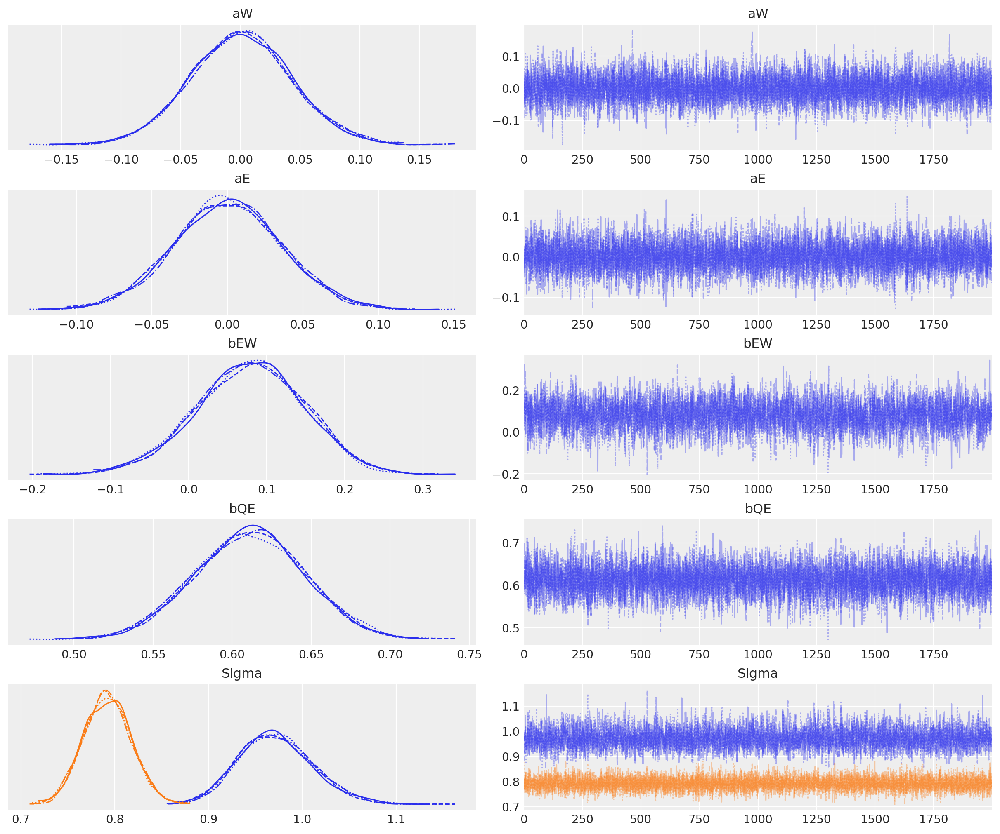

In [36]:
# Not displaying Rho variable as it causes error
az.plot_trace(trace_14_6, var_names=["aW", "aE", "bEW", "bQE", "Sigma"], compact=True);

#### Code 14.27

In [37]:
with m14_4:
    pm.set_data({"W_obs": dat_sim.W.values})  # replace `dat_sim.W` with new obs
    trace_14_4x = pm.sample(random_seed=RANDOM_SEED)

with m14_6:
    pm.set_data(
        {"WE_obs": dat_sim[["W", "E"]].values}
    )  # replace `dat_sim[["W", "E"]].values` with new obs
    trace_14_6x = pm.sample(2000, random_seed=RANDOM_SEED)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, aE, bEW, bQE, chol_cov]


Output()

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/pytensor/compile/function/types.py:1039: RuntimeWarning: invalid value encountered in accumulate
  outputs = vm() if output_subset is None else vm(output_subset=output_subset)


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 6 seconds.


#### Code 14.28

In [38]:
N = 500
U_sim = np.random.normal(size=N)
Q_sim = np.random.randint(1, 5, N)
E_sim = np.random.normal(loc=U_sim + Q_sim, size=N)
W_sim = np.random.normal(loc=-U_sim + 0.2 * E_sim, size=N)
dat_sim2 = pd.DataFrame.from_dict(
    {"W": standardize(W_sim), "E": standardize(E_sim), "Q": standardize(Q_sim)}
)
dat_sim2.head()

,W,E,Q
0,-0.917416,1.350022,1.311090
1,-0.870565,-1.356785,0.419192
2,1.142681,-0.546050,1.311090
3,0.700979,0.547991,-1.364604
4,0.270847,-1.382342,-1.364604


In [39]:
with m14_4:
    pm.set_data({"W_obs": dat_sim2.W.values})
    trace_14_4x = pm.sample(random_seed=RANDOM_SEED)

with m14_6:
    pm.set_data({"WE_obs": dat_sim2[["W", "E"]].values})
    trace_14_6x = pm.sample(2000, random_seed=RANDOM_SEED)
trace_14_6x.posterior = trace_14_6x.posterior.rename_vars(
    {"chol_cov_corr": "Rho", "chol_cov_stds": "Sigma"}
)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, aE, bEW, bQE, chol_cov]


Output()

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/pytensor/compile/function/types.py:1039: RuntimeWarning: invalid value encountered in accumulate
  outputs = vm() if output_subset is None else vm(output_subset=output_subset)


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 5 seconds.


In [40]:
az.summary(trace_14_6x, var_names=["aW", "aE", "bEW", "bQE", "Rho", "Sigma"], round_to=2)

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,0.00,0.04,-0.07,0.07,0.0,0.0,12194.33,7030.94,1.0
aE,0.00,0.04,-0.07,0.07,0.0,0.0,10316.93,6361.07,1.0
bEW,-0.07,0.04,-0.14,0.00,0.0,0.0,9260.11,6352.13,1.0
bQE,0.01,0.04,-0.06,0.08,0.0,0.0,9089.59,6681.75,1.0
"Rho[0, 0]",1.00,0.00,1.00,1.00,0.0,NaN,8000.00,8000.00,NaN
"Rho[0, 1]",-0.16,0.04,-0.22,-0.09,0.0,0.0,10140.22,6667.26,1.0
"Rho[1, 0]",-0.16,0.04,-0.22,-0.09,0.0,0.0,10140.22,6667.26,1.0
"Rho[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7850.41,7523.77,1.0
Sigma[0],1.00,0.03,0.95,1.05,0.0,0.0,12113.97,7094.37,1.0
Sigma[1],1.00,0.03,0.95,1.05,0.0,0.0,9099.57,6273.13,1.0


#### Code 14.29

Using [`causalgraphicalmodels`](https://github.com/ijmbarr/causalgraphicalmodels) for graph drawing and analysis instead of `dagitty`, following the example of [fehiepsi's NumPyro version of Rethinking](https://github.com/fehiepsi/rethinking-numpyro).

In [41]:
from causalgraphicalmodels import CausalGraphicalModel

dagIV = CausalGraphicalModel(
    nodes=["E", "W", "U", "Q"], edges=[("E", "W"), ("U", "E"), ("U", "W"), ("Q", "E")]
)

for s in dagIV.observed_variables:
    if s in ["E", "W"]:
        continue
    cond1 = not dagIV.is_d_separated(s, "E")
    cond2 = dagIV.do("E").is_d_separated(s, "W")
    if cond1 and cond2:
        print(s)

ModuleNotFoundError: No module named 'causalgraphicalmodels'

#### Code 14.30

In [42]:
kl_dyads = pd.read_csv("Data/KosterLeckie.csv")
kl_dyads

,hidA,hidB,did,giftsAB,giftsBA,offset,drel1,drel2,drel3,drel4,dlndist,dass,d0125
0,1,2,1,0,4,0.000,0,0,1,0,-2.790,0.000,0
1,1,3,2,6,31,-0.003,0,1,0,0,-2.817,0.044,0
2,1,4,3,2,5,-0.019,0,1,0,0,-1.886,0.025,0
3,1,5,4,4,2,0.000,0,1,0,0,-1.892,0.011,0
4,1,6,5,8,2,-0.003,1,0,0,0,-3.499,0.022,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,22,24,296,0,1,0.000,0,0,1,0,-2.442,0.000,0
296,22,25,297,2,0,-0.637,0,0,0,1,-1.747,0.026,0
297,23,24,298,2,0,-0.092,0,0,0,0,-1.798,0.000,0
298,23,25,299,4,0,-0.818,0,0,1,0,-1.848,0.031,0


#### Code 14.31

In [43]:
N = len(kl_dyads)
N_households = kl_dyads.hidB.max()
did = (kl_dyads.did - 1).values
hidA = (kl_dyads.hidA - 1).values
hidB = (kl_dyads.hidB - 1).values

To specify the matrix `d` of dyad effects, you can't force the standard deviations to be the same in PyMC (at least not yet ;)). The model will infer it though, as they are basically the same. To convince you, just run:
```python
az.summary(idata_14_7, var_names=["Rho_d", "sigma_d"], round_to=2)
```

In [44]:
with pm.Model() as m14_7:
    ## gr matrix of varying effects
    sd_dist = pm.Exponential.dist(1.0)
    chol_gr, _, _ = pm.LKJCholeskyCov("chol_gr", n=2, eta=4, sd_dist=sd_dist, compute_corr=True)
    gr = pm.MvNormal("gr", mu=0.0, chol=chol_gr, shape=(N_households, 2))

    ## dyad effects
    chol_dyad, _, _ = pm.LKJCholeskyCov("chol_dyad", n=2, eta=8, sd_dist=sd_dist, compute_corr=True)
    z = pm.Normal("z", 0.0, 1.0, shape=(2, N))
    d = pm.Deterministic("d", pm.math.dot(chol_dyad, z).T)

    # linear models
    a = pm.Normal("a", mu=0.0, sigma=1.0)
    lambdaAB = pm.math.exp(a + gr[hidA, 0] + gr[hidB, 1] + d[did, 0])
    lambdaBA = pm.math.exp(a + gr[hidB, 0] + gr[hidA, 1] + d[did, 1])

    giftsAB = pm.Poisson("giftsAB", lambdaAB, observed=kl_dyads.giftsAB)
    giftsBA = pm.Poisson("giftsBA", lambdaBA, observed=kl_dyads.giftsBA)

    trace_14_7 = pm.sample(2000, tune=3000, random_seed=RANDOM_SEED)

post = trace_14_7.posterior = trace_14_7.posterior.rename_vars(
    {
        "chol_gr_corr": "Rho_gr",
        "chol_gr_stds": "sigma_gr",
        "chol_dyad_corr": "Rho_d",
        "chol_dyad_stds": "sigma_d",
    }
)

Initializing NUTS using jitter+adapt_diag...
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_gr, gr, chol_dyad, z, a]


Output()

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/pymc/step_methods/hmc/quadpotential.py:316: RuntimeWarning: overflow encountered in dot
  return 0.5 * np.dot(x, v_out)


Sampling 4 chains for 3_000 tune and 2_000 draw iterations (12_000 + 8_000 draws total) took 72 seconds.


#### Code 14.32

In [45]:
az.summary(trace_14_7, var_names=["Rho_gr", "sigma_gr"], round_to=2)

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"Rho_gr[0, 0]",1.00,0.00,1.00,1.00,0.0,NaN,8000.00,8000.00,NaN
"Rho_gr[0, 1]",-0.42,0.20,-0.74,-0.11,0.0,0.0,2032.69,3562.70,1.0
"Rho_gr[1, 0]",-0.42,0.20,-0.74,-0.11,0.0,0.0,2032.69,3562.70,1.0
"Rho_gr[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,8059.56,8000.00,1.0
sigma_gr[0],0.83,0.14,0.61,1.04,0.0,0.0,3330.13,4181.88,1.0
sigma_gr[1],0.42,0.09,0.26,0.55,0.0,0.0,1717.43,3473.54,1.0


#### Code 14.33

In [46]:
g = (post["a"] + post["gr"].sel({"gr_dim_1": 0})).stack(sample=("chain", "draw"))
r = (post["a"] + post["gr"].sel({"gr_dim_1": 1})).stack(sample=("chain", "draw"))
Eg_mu = np.exp(g).mean(dim="sample")
Er_mu = np.exp(r).mean(dim="sample")

#### Code 14.34

Adapted from [fehiepsi's port](https://fehiepsi.github.io/rethinking-numpyro/14-adventures-in-covariance.html#Code-14.34) of _Rethinking_ to NumPyro:

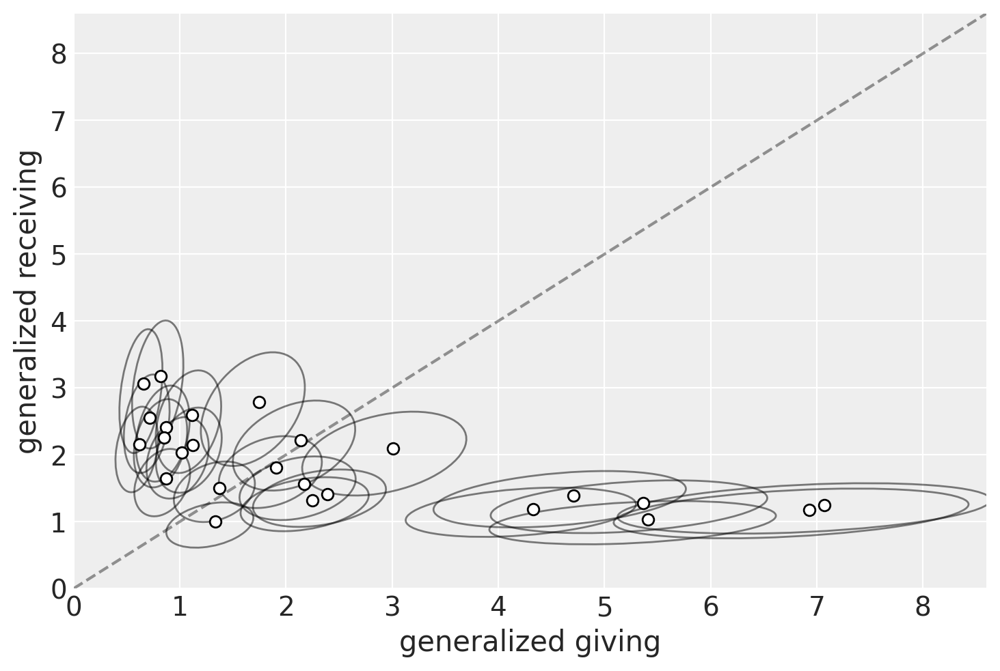

In [47]:
_, ax = plt.subplots(1, 1, constrained_layout=True)
x = np.linspace(0, 9, 101)
ax.plot(x, x, "k--", lw=1.5, alpha=0.4)

# ellipses
for house in range(25):
    Sigma = np.cov(np.stack([np.exp(g[house].values), np.exp(r[house].values)]))
    Mu = np.stack([np.exp(g[house].values.mean()), np.exp(r[house].values.mean())])

    pearson = Sigma[0, 1] / np.sqrt(Sigma[0, 0] * Sigma[1, 1])
    ellipse = Ellipse(
        (0, 0),
        np.sqrt(1 + pearson),
        np.sqrt(1 - pearson),
        edgecolor="k",
        alpha=0.5,
        facecolor="none",
    )
    std_dev = stats.norm.ppf((1 + np.sqrt(0.5)) / 2)
    scale_x = 2 * std_dev * np.sqrt(Sigma[0, 0])
    scale_y = 2 * std_dev * np.sqrt(Sigma[1, 1])
    scale = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y)
    ellipse.set_transform(scale.translate(Mu[0], Mu[1]) + ax.transData)
    ax.add_patch(ellipse)

# household means
ax.plot(Eg_mu, Er_mu, "ko", mfc="white", lw=1.5)

ax.set(
    xlim=(0, 8.6),
    ylim=(0, 8.6),
    xlabel="generalized giving",
    ylabel="generalized receiving",
);

#### Code 14.35

In [48]:
az.summary(trace_14_7, var_names=["Rho_d", "sigma_d"], round_to=2)

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"Rho_d[0, 0]",1.00,0.00,1.00,1.00,0.0,NaN,8000.00,8000.00,NaN
"Rho_d[0, 1]",0.88,0.03,0.83,0.94,0.0,0.0,1706.09,3630.77,1.0
"Rho_d[1, 0]",0.88,0.03,0.83,0.94,0.0,0.0,1706.09,3630.77,1.0
"Rho_d[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7747.07,7455.46,1.0
sigma_d[0],1.07,0.07,0.96,1.18,0.0,0.0,2131.34,4026.39,1.0
sigma_d[1],1.13,0.07,1.02,1.23,0.0,0.0,2399.87,4390.26,1.0


#### Code 14.36

In [49]:
dy1 = post["d"].sel({"d_dim_1": 0}).mean(dim=("chain", "draw"))
dy2 = post["d"].sel({"d_dim_1": 1}).mean(dim=("chain", "draw"))

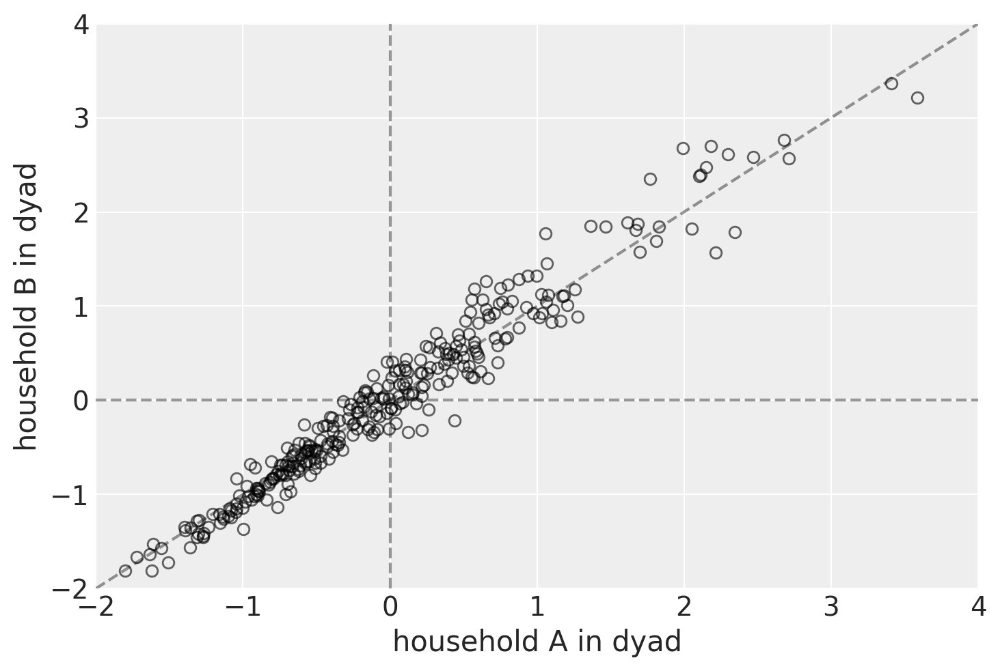

In [50]:
_, ax = plt.subplots(1, 1, constrained_layout=True)
x = np.linspace(-2, 4, 101)

ax.plot(x, x, "k--", lw=1.5, alpha=0.4)
ax.axhline(linewidth=1.5, color="k", ls="--", alpha=0.4)
ax.axvline(linewidth=1.5, color="k", ls="--", alpha=0.4)
ax.plot(dy1, dy2, "ko", mfc="none", lw=1.5, alpha=0.6)

ax.set(
    xlim=(-2, 4),
    ylim=(-2, 4),
    xlabel="household A in dyad",
    ylabel="household B in dyad",
);

#### Code 14.37

In [51]:
Dmat = pd.read_csv("Data/islandsDistMatrix.csv", sep=",", index_col=0)
Dmat.round(1)

,Ml,Ti,SC,Ya,Fi,Tr,Ch,Mn,To,Ha
Malekula,0.0,0.5,0.6,4.4,1.2,2.0,3.2,2.8,1.9,5.7
Tikopia,0.5,0.0,0.3,4.2,1.2,2.0,2.9,2.7,2.0,5.3
Santa Cruz,0.6,0.3,0.0,3.9,1.6,1.7,2.6,2.4,2.3,5.4
Yap,4.4,4.2,3.9,0.0,5.4,2.5,1.6,1.6,6.1,7.2
Lau Fiji,1.2,1.2,1.6,5.4,0.0,3.2,4.0,3.9,0.8,4.9
Trobriand,2.0,2.0,1.7,2.5,3.2,0.0,1.8,0.8,3.9,6.7
Chuuk,3.2,2.9,2.6,1.6,4.0,1.8,0.0,1.2,4.8,5.8
Manus,2.8,2.7,2.4,1.6,3.9,0.8,1.2,0.0,4.6,6.7
Tonga,1.9,2.0,2.3,6.1,0.8,3.9,4.8,4.6,0.0,5.0
Hawaii,5.7,5.3,5.4,7.2,4.9,6.7,5.8,6.7,5.0,0.0


#### Code 14.38

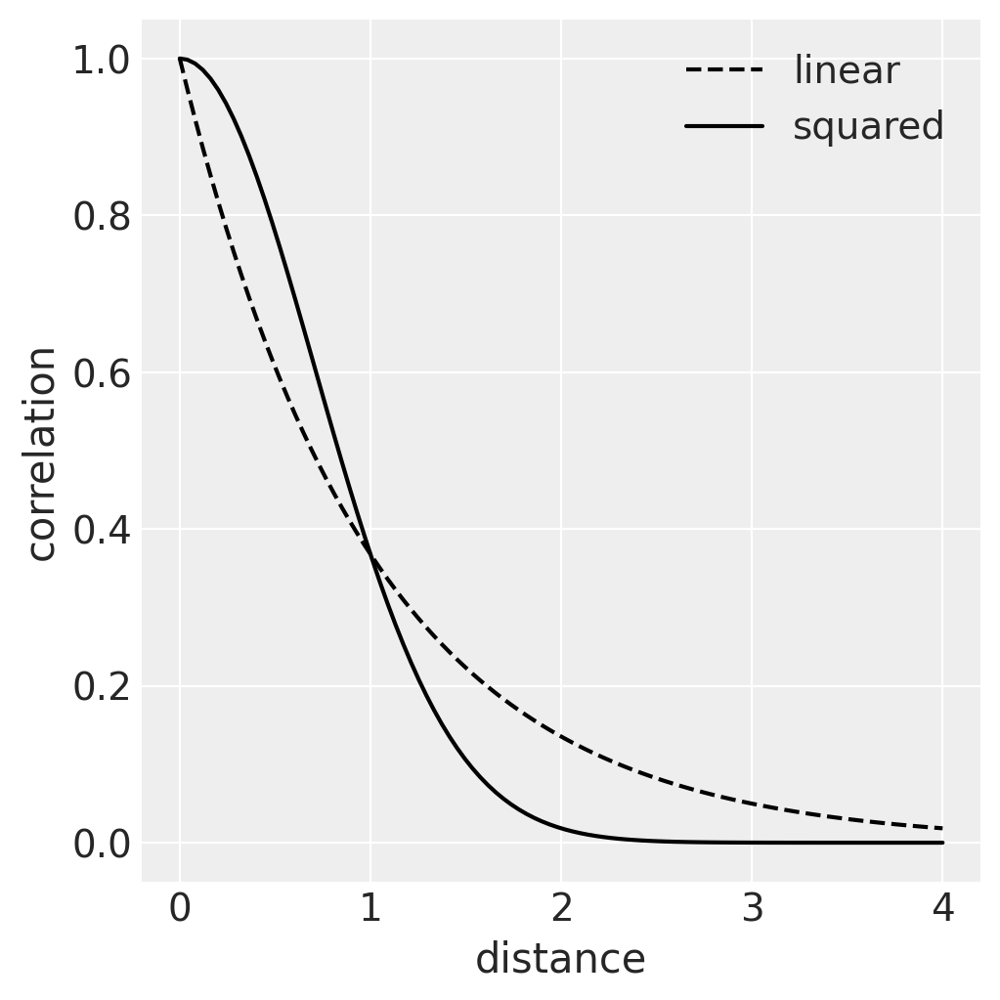

In [52]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))

xrange = np.linspace(0, 4, 100)
# linear
ax.plot(xrange, np.exp(-1 * xrange), "k--", label="linear")
# squared
ax.plot(xrange, np.exp(-1 * xrange**2), "k", label="squared")

ax.set_xlabel("distance")
ax.set_ylabel("correlation")
plt.legend();

#### Code 14.39

In [140]:
# load the ordinary data, now with coordinates
dk = pd.read_csv("Data/Kline2.csv", sep=",")

Nsociety = dk.shape[0]
society = np.arange(Nsociety)
total_tools = dk.total_tools.values

Dmat = Dmat.values
Dmatsq = np.power(Dmat, 2)

P = standardize(np.log(dk.population)).values
P = P + np.abs(P.min()) + 0.1  # must be > 0, see chp 11

dk

,culture,population,contact,total_tools,mean_TU,lat,lon,lon2,logpop
0,Malekula,1100,low,13,3.2,-16.3,167.5,-12.5,7.003065
1,Tikopia,1500,low,22,4.7,-12.3,168.8,-11.2,7.313220
2,Santa Cruz,3600,low,24,4.0,-10.7,166.0,-14.0,8.188689
3,Yap,4791,high,43,5.0,9.5,138.1,-41.9,8.474494
4,Lau Fiji,7400,high,33,5.0,-17.7,178.1,-1.9,8.909235
5,Trobriand,8000,high,19,4.0,-8.7,150.9,-29.1,8.987197
6,Chuuk,9200,high,40,3.8,7.4,151.6,-28.4,9.126959
7,Manus,13000,low,28,6.6,-2.1,146.9,-33.1,9.472705
8,Tonga,17500,high,55,5.4,-21.2,-175.2,4.8,9.769956
9,Hawaii,275000,low,71,6.6,19.9,-155.6,24.4,12.524526


In [143]:
with pm.Model() as m14_8:
    a = pm.Exponential("a", 1.0)
    b = pm.Exponential("b", 1.0)
    g = pm.Exponential("g", 1.0)

    etasq = pm.Exponential("etasq", 2.0)
    ls_inv = pm.HalfNormal("ls_inv", 2.0)
    rhosq = pm.Deterministic("rhosq", 0.5 * ls_inv**2)

    # Implementation with PyMC's GP module:
    cov = etasq * pm.gp.cov.ExpQuad(input_dim=1, ls_inv=ls_inv)
    gp = pm.gp.Latent(cov_func=cov)
    k = gp.prior("k", X=Dmat)

    lam = (a * P**b / g) * at.exp(k[society])

    T = pm.Poisson("total_tools", lam, observed=total_tools)

    trace_14_8 = pm.sample(4000, tune=2000, target_accept=0.99, idata_kwargs={"log_likelihood": True},
                           random_seed=RANDOM_SEED)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, g, etasq, ls_inv, k_rotated_]


Output()

ValueError: Not enough samples to build a trace.

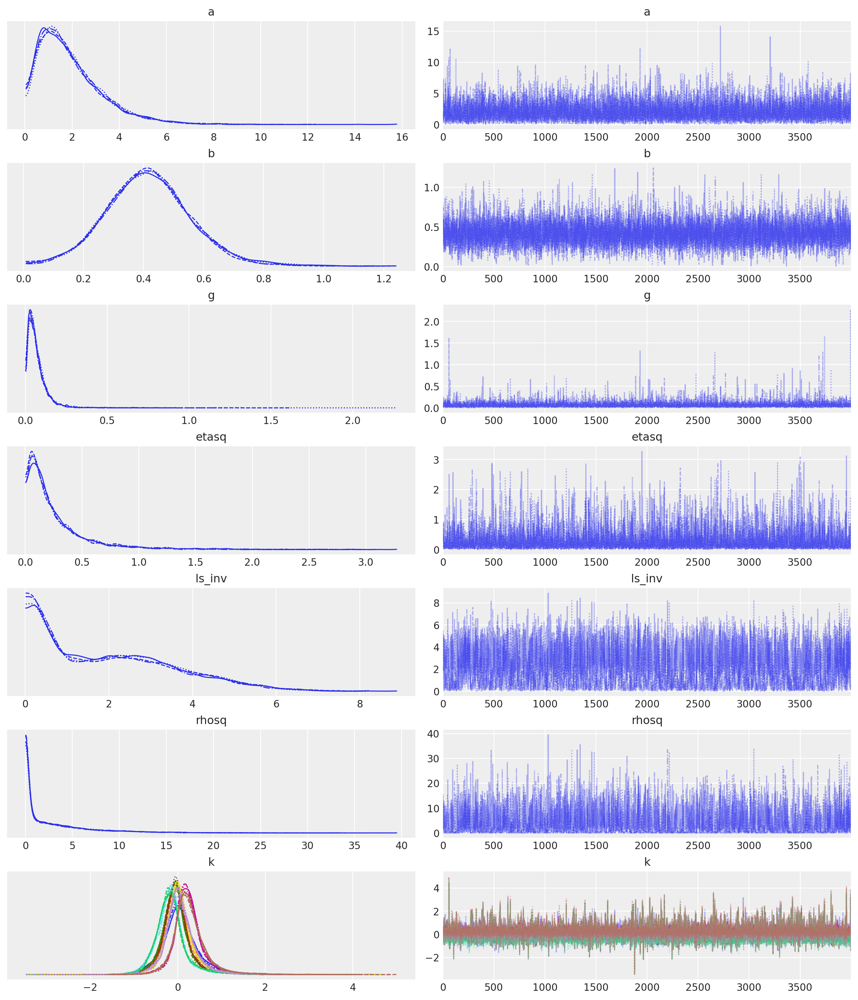

In [55]:
az.plot_trace(trace_14_8, var_names=["~k_rotated_"], compact=True);

#### Code 14.40

In [56]:
az.summary(trace_14_8, var_names=["~k_rotated_"], round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,1.94,1.37,0.07,3.66,0.01,0.02,7973.40,6689.97,1.0
b,0.42,0.14,0.19,0.64,0.00,0.00,6116.13,4819.56,1.0
g,0.07,0.07,0.00,0.13,0.00,0.00,7312.13,7077.44,1.0
etasq,0.27,0.31,0.00,0.57,0.00,0.01,5825.08,8216.51,1.0
ls_inv,1.98,1.59,0.00,4.18,0.04,0.01,1226.20,3545.22,1.0
rhosq,3.24,4.30,0.00,8.71,0.09,0.05,1226.20,3545.22,1.0
k[0],0.06,0.46,-0.64,0.75,0.00,0.01,8456.22,9416.33,1.0
k[1],0.02,0.41,-0.55,0.61,0.00,0.01,10073.97,9072.99,1.0
k[2],-0.05,0.39,-0.61,0.45,0.00,0.01,11054.94,7056.91,1.0
k[3],0.25,0.39,-0.31,0.74,0.00,0.01,10279.29,7148.50,1.0


#### Code 14.41

In [57]:
# compute posterior median covariance
x_seq = np.linspace(0, 10, 100)
post = trace_14_8.posterior.stack(sample=("chain", "draw"))
pmcov_mu = post["etasq"].median().values * np.exp(-post["rhosq"].median().values * (x_seq**2))

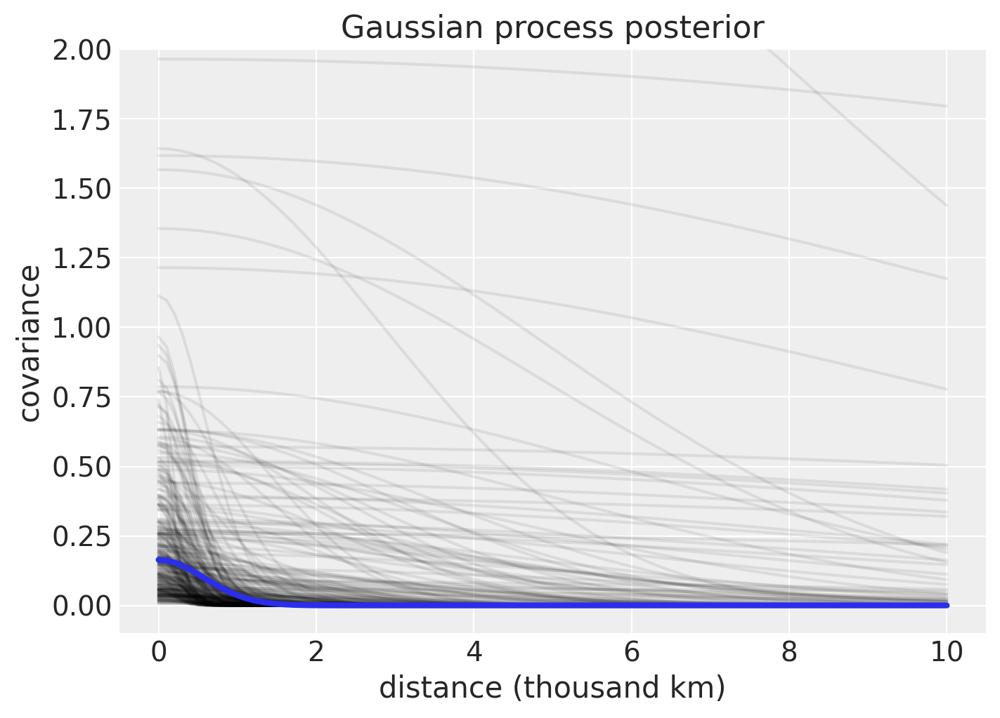

In [58]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

# plot functions sampled from posterior
ax.plot(
    x_seq,
    (
        post["etasq"][::50].values[:, None]
        * np.exp(-post["rhosq"][::50].values[:, None] * (x_seq**2))
    ).T,
    "k",
    alpha=0.08,
)

# plot median covariance function
ax.plot(x_seq, pmcov_mu, lw=3)

ax.set(
    title="Gaussian process posterior",
    ylim=(-0.1, 2),
    xlabel="distance (thousand km)",
    ylabel="covariance",
);

#### Code 14.42

In [59]:
# compute posterior median covariance among societies
K = post["etasq"].median().values * np.exp(-post["rhosq"].median().values * Dmatsq) + np.diag(
    [0.01] * Nsociety
)

#### Code 14.43

In [60]:
# convert to correlation matrix
sigma_post = np.sqrt(np.diag(K))
Rho = (sigma_post**-1) * K * (sigma_post**-1)

# add row/col names for convenience
Rho = pd.DataFrame(
    Rho,
    index=["Ml", "Ti", "SC", "Ya", "Fi", "Tr", "Ch", "Mn", "To", "Ha"],
    columns=["Ml", "Ti", "SC", "Ya", "Fi", "Tr", "Ch", "Mn", "To", "Ha"],
)

Rho.round(2)

,Ml,Ti,SC,Ya,Fi,Tr,Ch,Mn,To,Ha
Ml,1.00,0.67,0.52,0.00,0.09,0.00,0.00,0.00,0.01,0.0
Ti,0.67,1.00,0.81,0.00,0.09,0.00,0.00,0.00,0.00,0.0
SC,0.52,0.81,1.00,0.00,0.03,0.01,0.00,0.00,0.00,0.0
Ya,0.00,0.00,0.00,1.00,0.00,0.00,0.02,0.02,0.00,0.0
Fi,0.09,0.09,0.03,0.00,1.00,0.00,0.00,0.00,0.39,0.0
Tr,0.00,0.00,0.01,0.00,0.00,1.00,0.01,0.32,0.00,0.0
Ch,0.00,0.00,0.00,0.02,0.00,0.01,1.00,0.10,0.00,0.0
Mn,0.00,0.00,0.00,0.02,0.00,0.32,0.10,1.00,0.00,0.0
To,0.01,0.00,0.00,0.00,0.39,0.00,0.00,0.00,1.00,0.0
Ha,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.0


#### Code 14.44 and 14.45

There seems to be a typo in the book: the posterior predictive computations in the second plot are done according to the model from the first edition: $\lambda = exp(\alpha + \beta_p x logpop)$. We'll use the right version here, i.e the model that we just ran above: $\lambda = \frac{\alpha P^\beta}{\gamma}$.

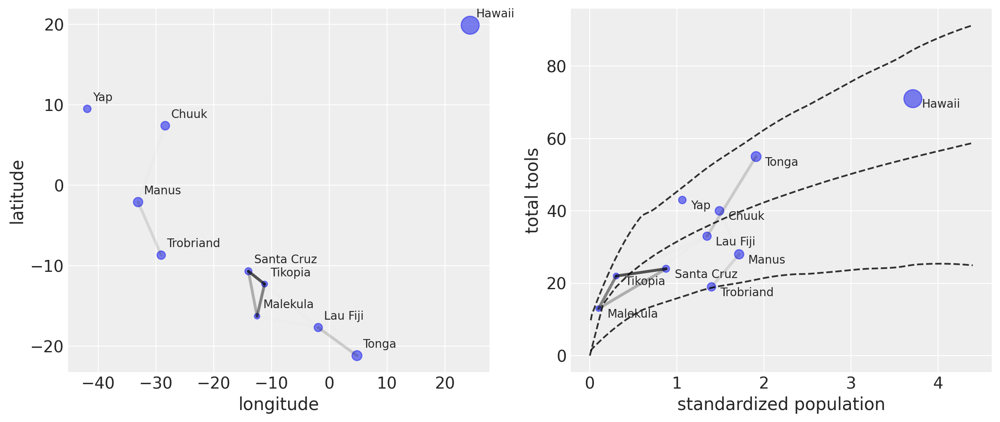

In [61]:
# Code 14.44
# scale point size to logpop
logpop = np.copy(dk["logpop"].values)
logpop /= logpop.max()
psize = np.exp(logpop * 5.5)

_, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# plot raw data and labels
ax0.scatter(dk["lon2"], dk["lat"], psize, alpha=0.6)
labels = dk["culture"].values
for i, itext in enumerate(labels):
    ax0.text(dk["lon2"][i] + 1, dk["lat"][i] + 1, itext)

# overlay lines shaded by Rho
for i in range(10):
    for j in np.arange(i + 1, 10):
        ax0.plot(
            [dk["lon2"][i], dk["lon2"][j]],
            [dk["lat"][i], dk["lat"][j]],
            "k-",
            alpha=Rho.iloc[i, j] ** 2,
            lw=2.5,
        )

ax0.set_xlabel("longitude")
ax0.set_ylabel("latitude")

# Code 14.45
# compute posterior median relationship, ignoring distance
P_seq = np.linspace(-1.4, 3.0, 30) + 1.4  # our little trick from chp 11
lambda_post = (
    post["a"].values[:, None] * P_seq ** post["b"].values[:, None] / post["g"].values[:, None]
)

# plot raw data and labels
ax1.scatter(P, dk["total_tools"], psize, alpha=0.6)
labels = dk["culture"].values
for i, itext in enumerate(labels):
    ax1.text(P[i] + 0.1, dk["total_tools"][i] - 2.5, itext)

# display posterior predictions
ax1.plot(P_seq, np.median(lambda_post, axis=0), "--", color="k", alpha=0.8)
az.plot_hdi(
    P_seq,
    lambda_post,
    color="k",
    ax=ax1,
    fill_kwargs={"alpha": 0},
    plot_kwargs={"color": "k", "ls": "--", "alpha": 0.8},
)

# overlay correlations
for i in range(10):
    for j in np.arange(i + 1, 10):
        ax1.plot(
            [P[i], P[j]],
            [dk["total_tools"][i], dk["total_tools"][j]],
            "k-",
            alpha=Rho.iloc[i, j] ** 2,
            lw=2.5,
        )

ax1.set_xlabel("standardized population")
ax1.set_ylabel("total tools");

#### Code 14.46

Related to Stan. PyMC's GP module automatically reparametrizes with the Cholesky factor of the covariance matrix under the hood.

#### Code 14.47

The `ape`-package-related computations are very specific to the example and not related to PyMC usage, so let's just load the CSV file and the ready-made image:

In [62]:
Primates301 = pd.read_csv("Data/Primates301.csv", sep=";")

![image](Data/Primates301.png)

#### Code 14.48

In [63]:
dpymc = Primates301.dropna(subset=["group_size", "body", "brain"])
spp_obs = dpymc["name"]
dpymc

,name,genus,species,subspecies,spp_id,genus_id,social_learning,research_effort,brain,body,group_size,gestation,weaning,longevity,sex_maturity,maternal_investment
0,Allenopithecus_nigroviridis,Allenopithecus,nigroviridis,NaN,1,1,0.0,6.0,58.02,4655.0,40.00,NaN,106.15,276.0,NaN,NaN
2,Alouatta_belzebul,Alouatta,belzebul,NaN,3,3,0.0,15.0,52.84,6395.0,7.40,NaN,NaN,NaN,NaN,NaN
3,Alouatta_caraya,Alouatta,caraya,NaN,4,3,0.0,45.0,52.63,5383.0,8.90,185.92,323.16,243.6,1276.72,509.08
4,Alouatta_guariba,Alouatta,guariba,NaN,5,3,0.0,37.0,51.70,5175.0,7.40,NaN,NaN,NaN,NaN,NaN
5,Alouatta_palliata,Alouatta,palliata,NaN,6,3,3.0,79.0,49.88,6250.0,13.10,185.42,495.60,300.0,1578.42,681.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,Trachypithecus_obscurus,Trachypithecus,obscurus,NaN,295,67,0.0,6.0,62.12,7056.0,10.00,146.63,362.93,300.0,NaN,509.56
295,Trachypithecus_phayrei,Trachypithecus,phayrei,NaN,296,67,0.0,16.0,72.84,7475.0,12.90,180.61,305.87,NaN,NaN,486.48
296,Trachypithecus_pileatus,Trachypithecus,pileatus,NaN,297,67,0.0,5.0,103.64,11794.0,8.50,NaN,NaN,NaN,NaN,NaN
298,Trachypithecus_vetulus,Trachypithecus,vetulus,NaN,299,67,0.0,2.0,61.29,6237.0,8.35,204.72,245.78,276.0,1113.70,450.50


#### Code 14.49

In [64]:
N_spp = len(dpymc)
M = standardize(np.log(dpymc.body.values))
B_ = standardize(np.log(dpymc.brain.values))
G = standardize(np.log(dpymc.group_size.values))
Imat = np.diag(np.ones(N_spp))

In [65]:
with pm.Model() as m14_9:
    a = pm.Normal("a", 0.0, 1.0)
    bM = pm.Normal("bM", 0.0, 0.5)
    bG = pm.Normal("bG", 0.0, 0.5)
    sigma_sq = pm.Exponential("sigma_sq", 1.0)

    mu = a + bM * M + bG * G
    SIGMA = Imat * sigma_sq
    B = pm.MvNormal("B", mu, cov=SIGMA, observed=B_)

    trace_14_9 = pm.sample(random_seed=RANDOM_SEED)
az.summary(trace_14_9, round_to=2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bG, sigma_sq]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 16 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.00,0.02,-0.03,0.03,0.0,0.0,4271.74,2794.39,1.0
bM,0.89,0.02,0.86,0.93,0.0,0.0,2766.58,2939.86,1.0
bG,0.12,0.02,0.09,0.16,0.0,0.0,2630.39,2567.50,1.0
sigma_sq,0.05,0.01,0.04,0.06,0.0,0.0,3368.30,2676.52,1.0


#### Code 14.50

The `ape`-package-related computations are very specific to the example and not related to PyMC usage, so let's just load the CSV files:

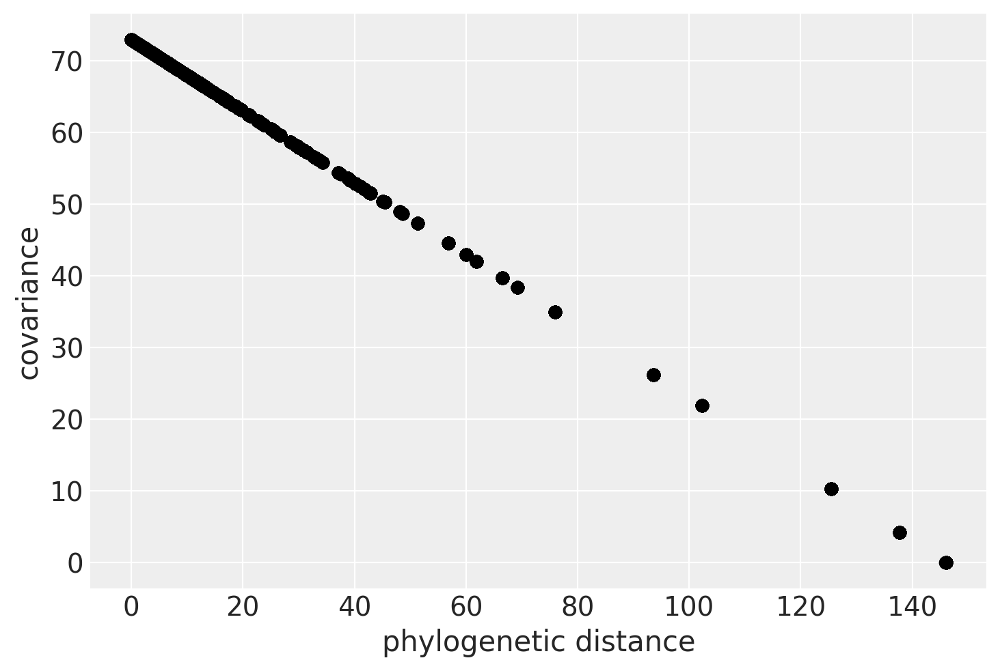

In [66]:
V = pd.read_csv("Data/Primates301_vcov_matrix.csv", index_col=0)
Dmat = pd.read_csv("Data/Primates301_distance_matrix.csv", index_col=0)

plt.plot(Dmat, V, "ko")
plt.xlabel("phylogenetic distance")
plt.ylabel("covariance");

#### Code 14.51

In [67]:
# put species in right order
V_ord = V.loc[spp_obs, spp_obs]
# convert to correlation matrix
R = (V_ord / V_ord.max()).values

In [68]:
# Brownian motion model
with pm.Model() as m14_10:
    a = pm.Normal("a", 0.0, 1.0)
    bM = pm.Normal("bM", 0.0, 0.5)
    bG = pm.Normal("bG", 0.0, 0.5)
    sigma_sq = pm.Exponential("sigma_sq", 1.0)

    mu = a + bM * M + bG * G
    SIGMA = R * sigma_sq
    B = pm.MvNormal("B", mu, cov=SIGMA, observed=B_)

    trace_14_10 = pm.sample(random_seed=RANDOM_SEED)
az.summary(trace_14_10, round_to=2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bG, sigma_sq]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 13 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.20,0.17,-0.46,0.08,0.0,0.0,5999.91,3289.39,1.0
bM,0.70,0.04,0.64,0.76,0.0,0.0,5297.27,3245.06,1.0
bG,-0.01,0.02,-0.04,0.02,0.0,0.0,6028.08,3471.73,1.0
sigma_sq,0.16,0.02,0.13,0.19,0.0,0.0,5755.04,3442.43,1.0


#### Code 14.52

In [69]:
# scale and reorder distance matrix
Dmat_ord = (Dmat.loc[spp_obs, spp_obs] / Dmat.loc[spp_obs, spp_obs].max()).values

This is a good opportunity to show a use-case of PyMC's GP module. In the Oceanic tools example above, we didn't need a mean function (which means it was automatically set to 0 by PyMC). Now however, we need both a mean function _and_ a covariance function to specify our GP. The covariance function will look familiar. For the mean function, we could use `gp.mean.Linear`, which takes as input a matrix of coefficients and a vector of intercepts. But that mean function would then be evaluated on our distance matrix, as `SIGMA` will be.

We don't want that -- we only want the mean function to depend on `M` and `G` not on the phylogenetic distance. We can easily [define a custom mean function](https://docs.pymc.io/notebooks/GP-MeansAndCovs.html#Defining-a-custom-mean-function) in PyMC. We just need to subclass `pm.gp.mean.Mean` and provide `__call__` and `__init__` methods:

In [70]:
class LinearMean(pm.gp.mean.Mean):
    def __init__(self, intercept, slopes):
        self.intercept = intercept
        self.slopes = slopes

    def __call__(self, X):
        """In the trace summary, b0 will be bM and b1 will be bG"""
        return self.intercept + self.slopes[0] * M + self.slopes[1] * G

And we can easily use this function in our model below. Notice we use `pm.gp.Marginal` and `gp.marginal_likelihood` instead of `pm.gp.Latent` and `gp.prior` as in the Oceanic tools example. It's because here we have a (multivariate) normal likelihood, which works well analytically with a GP prior, so `Marginal` and `marginal_likelihood` just take advantage of the closed-form solution to speed-up computations. It's also why you see no calls to `pm.MvNormal` below: this is implicit in `marginal_likelihood`, which evaluates the GP at the `X` points (`Dmat_ord`). And do you recall what the evaluation of a GP is? An MvNormal random variable -- bingo!

In [71]:
with pm.Model() as m14_11:
    a = pm.Normal("a", 0.0, 1.0)
    b = pm.Normal("b", 0.0, 0.5, shape=2)
    # specify the mean function:
    mu = LinearMean(intercept=a, slopes=b)

    # half_normal(1, 0.25) is too strong
    etasq = pm.Exponential("etasq", 1.0)
    rhosq = pm.Normal("rhosq", 3.0, 0.25)
    # specify the covariance function:
    SIGMA = etasq * pm.gp.cov.Exponential(input_dim=1, ls=rhosq)

    # specify the GP:
    gp = pm.gp.Marginal(mean_func=mu, cov_func=SIGMA)

    # place a GP prior over the observations.
    # SIGMA will be conditioned on Dmat_ord.
    # mu won't be, as we coded it on purpose.
    sigma = pm.Exponential("sigma", 1.0)
    B = gp.marginal_likelihood("B", X=Dmat_ord, y=B_, noise=sigma)

    trace_14_11 = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=RANDOM_SEED)

# b0 is bM and b1 is bG
az.summary(trace_14_11, round_to=2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, etasq, rhosq, sigma]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 60 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.06,0.68,-1.11,1.05,0.01,0.01,8651.44,5444.35,1.0
b[0],0.82,0.02,0.79,0.86,0.00,0.00,8591.51,6501.99,1.0
b[1],0.08,0.02,0.05,0.12,0.00,0.00,8689.46,6051.71,1.0
rhosq,2.99,0.25,2.59,3.39,0.00,0.00,10312.33,5542.06,1.0
etasq,1.08,0.60,0.31,1.86,0.01,0.01,9253.04,5610.25,1.0
sigma,0.17,0.01,0.15,0.19,0.00,0.00,10066.15,6992.74,1.0


All the posteriors are looking good and similar to the book, except for `etasq`. If you replace `etasq = pm.Exponential('etasq', 1.0)` by  `etasq = pm.Normal('etasq', 1.0, 0.25)`, you will see that this prior is too strong and is not moved by the data, which is why I changed it. Moreover, I don't understand how the results for `etasq` reported in the book could be so close to 0 ($[0.03, 0.05]$), especially with a prior as strong as `half_normal(1, 0.25)`.

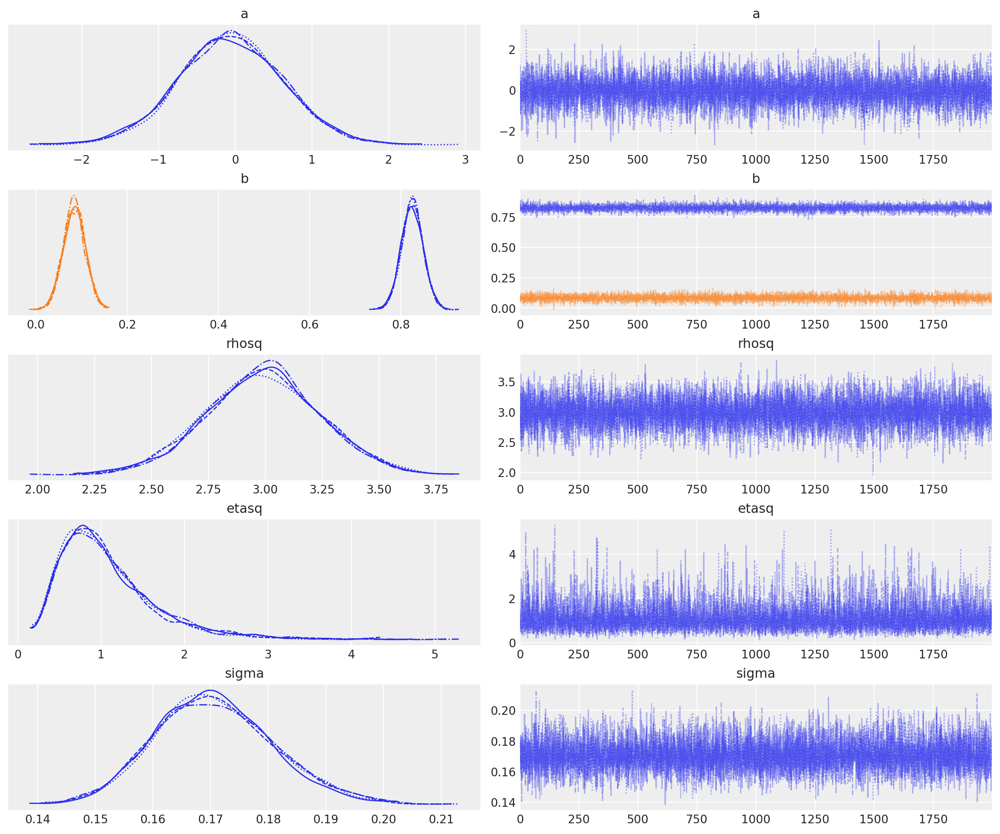

In [72]:
az.plot_trace(trace_14_11, compact=True);

#### Code 14.53

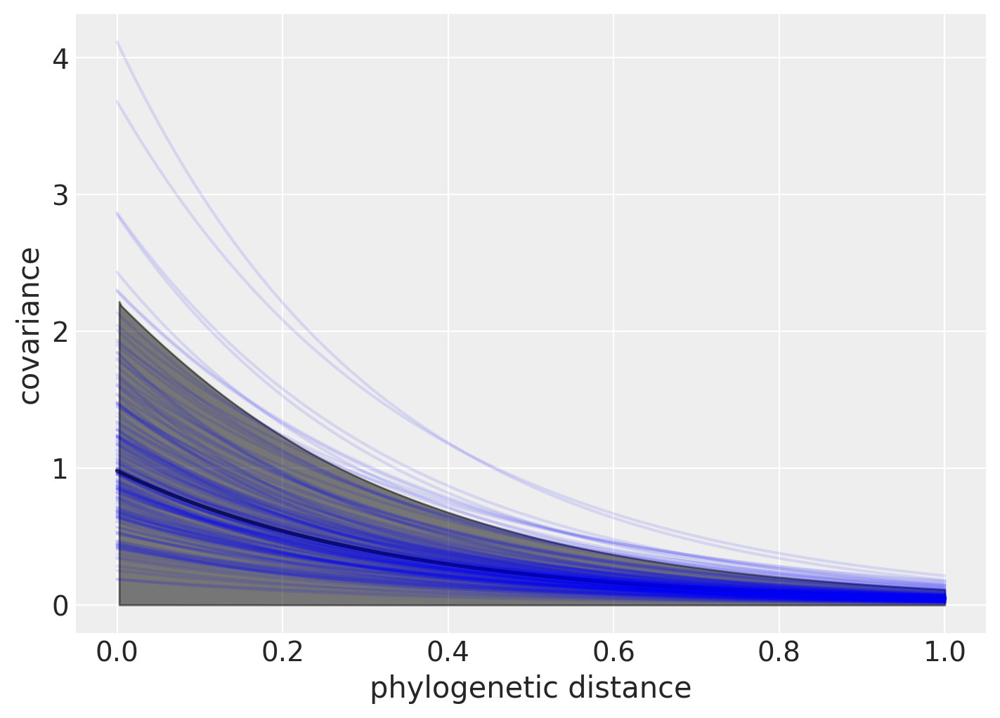

In [73]:
d_seq = np.linspace(0, Dmat_ord.max(), 100)
post = trace_14_11.posterior.stack(sample=("chain", "draw"))

_, ax = plt.subplots(1, 1, figsize=(7, 5))

# prior mean and 89% interval
eta = np.random.exponential(1.0, 1000)
rho = np.random.normal(3.0, 0.25, 1000)
K = []
for d in d_seq:
    K.append(eta * np.exp(-rho * d))
K = np.asarray(K)

ax.plot(d_seq, K.mean(1), "k", alpha=0.8, lw=2)
az.plot_hdi(d_seq, K.T, color="k", ax=ax)

# posterior
post_etasq = post["etasq"][::50].values[:, None]
post_rhosq = post["rhosq"][::50].values[:, None]
ax.plot(d_seq, (post_etasq * np.exp(-post_rhosq * d_seq)).T, "b", alpha=0.1)

ax.set(xlabel="phylogenetic distance", ylabel="covariance");

## Neals funnel

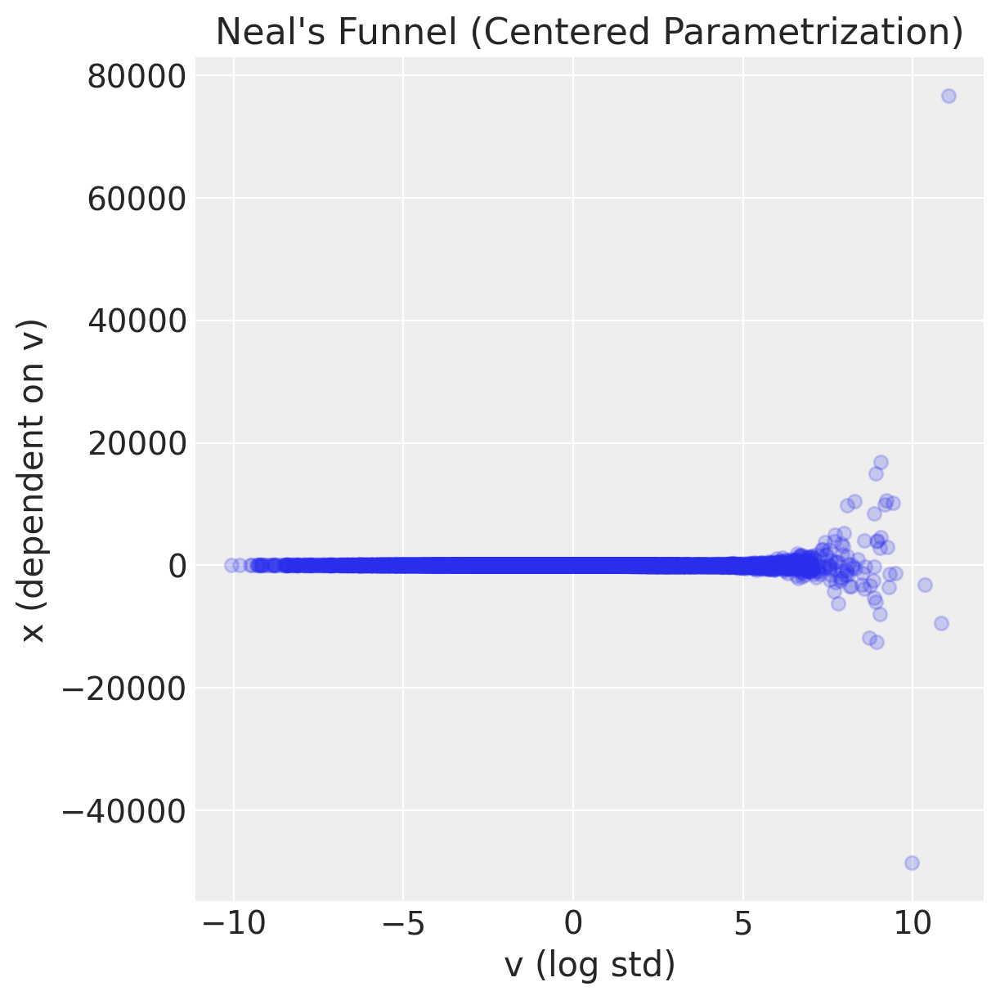

In [74]:
import numpy as np
import matplotlib.pyplot as plt

# Simulate from Neal's funnel
n = 10000
v = np.random.normal(0, 3, size=n)
x = np.random.normal(0, np.exp(v))

plt.figure(figsize=(6, 6))
plt.scatter(v, x, alpha=0.2)
plt.xlabel("v (log std)")
plt.ylabel("x (dependent on v)")
plt.title("Neal's Funnel (Centered Parametrization)")
plt.grid(True)
plt.show()

## Cholesky decomposition

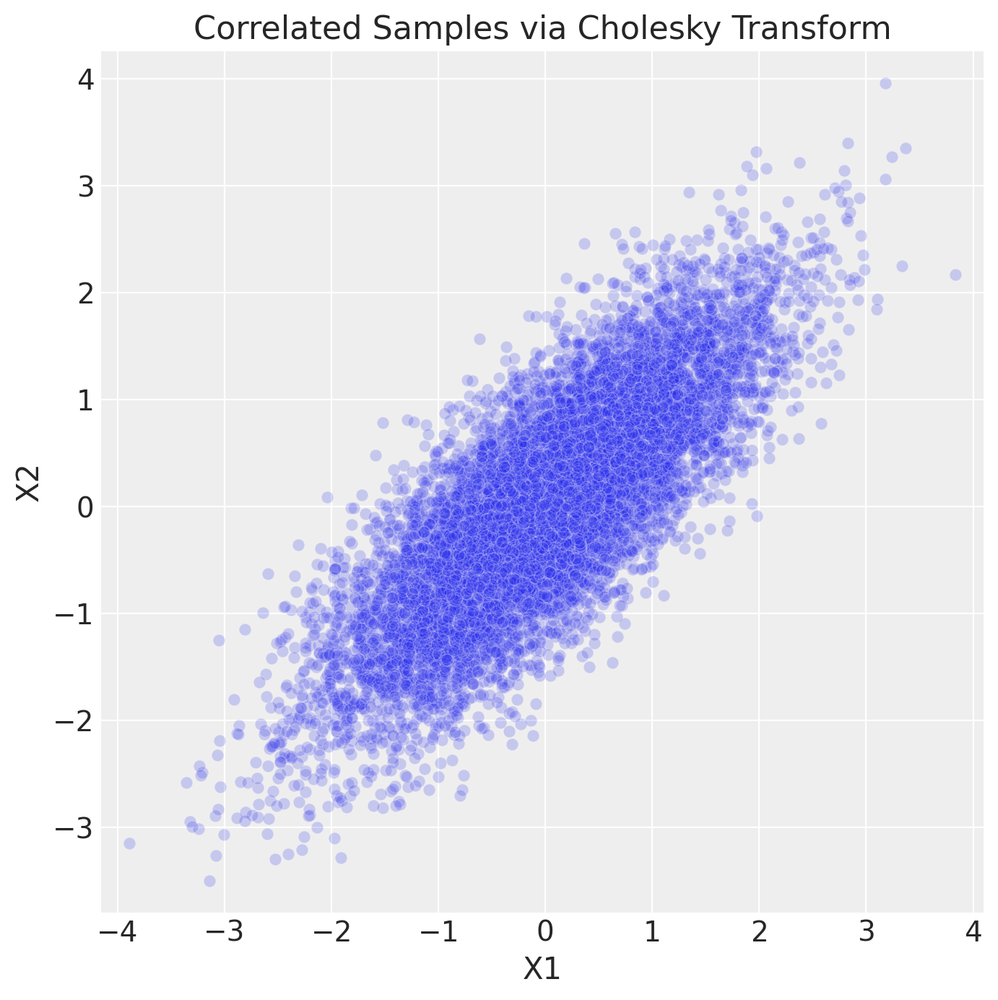

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Define a 2x2 correlation matrix
rho = 0.8  # desired correlation between variables
R = np.array([
    [1.0, rho],
    [rho, 1.0]
])

# Step 2: Compute the Cholesky decomposition (lower-triangular matrix)
L = np.linalg.cholesky(R)

# Step 3: Generate uncorrelated standard normal samples
n_samples = 10000
Z = np.random.normal(0, 1, size=(n_samples, 2))  # shape: (10000, 2)

# Step 4: Apply the Cholesky transformation to introduce correlation
X = Z @ L.T  # equivalent to L · Z in matrix algebra

# Step 5: Plot the result
plt.figure(figsize=(7, 7))
sns.scatterplot(x=X[:, 0], y=X[:, 1], alpha=0.2)
plt.title("Correlated Samples via Cholesky Transform")
plt.xlabel("X1")
plt.ylabel("X2")
plt.axis("equal")
plt.grid(True)
plt.tight_layout()
plt.show()

14M1.  Repeat the café robot simulation from the beginning of the chapter. This time, set rho to zero, so that there is no correlation between intercepts and slopes. How does the posterior distribution of the correlation reflect this change in the underlying simulation?

In [105]:
a = 3.5  # average morning wait time
b = -1.0  # average difference afternoon wait time
sigma_a = 1.0  # std dev in intercepts
sigma_b = 0.5  # std dev in slopes
# rho = -0.7  # correlation between intercepts and slopes
rho = 0  # correlation between intercepts and slopes
N_cafes = 20
Mu = [a, b]

sigmas = [sigma_a, sigma_b]
Rho = np.matrix([[1, rho], [rho, 1]])

Sigma = np.diag(sigmas) * Rho * np.diag(sigmas)

vary_effects = np.random.multivariate_normal(mean=Mu, cov=Sigma, size=N_cafes)

a_cafe = vary_effects[:, 0]
b_cafe = vary_effects[:, 1]

In [106]:
N_visits = 10
afternoon = np.tile([0, 1], N_visits * N_cafes // 2)  # wrap with int() to suppress warnings
cafe_id = np.repeat(np.arange(0, N_cafes), N_visits)  # 1-20 (minus 1 for python indexing)

mu = a_cafe[cafe_id] + b_cafe[cafe_id] * afternoon
sigma = 0.5  # std dev within cafes

wait = np.random.normal(loc=mu, scale=sigma, size=N_visits * N_cafes)
d = pd.DataFrame(dict(cafe=cafe_id, afternoon=afternoon, wait=wait))
cov_ab = sigma_a * sigma_b * rho
Sigma = np.array([[sigma_a**2, cov_ab], [cov_ab, sigma_b**2]])


In [78]:
cafe_idx = d["cafe"].values
with pm.Model() as m14_2:
    # LKJCholeskyCov is more efficient than LKJCorr
    # PyMC >= 3.9 extracts the stds and matrix of correlations automatically for us
    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
    )

    a = pm.Normal("a", 5.0, 2.0)  # prior for average intercept
    b = pm.Normal("b", -1.0, 0.5)  # prior for average slope
    ab_cafe = pm.MvNormal(
        "ab_cafe", mu=at.stack([a, b]), chol=chol, shape=(N_cafes, 2)
    )  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe

    mu = ab_cafe[cafe_idx, 0] + ab_cafe[cafe_idx, 1] * d["afternoon"].values  # linear model
    sigma_within = pm.Exponential("sigma_within", 1.0)  # prior stddev within cafes

    wait = pm.Normal("wait", mu=mu, sigma=sigma_within, observed=d["wait"].values)  # likelihood

    trace_m14_2 = pm.sample(4000, tune=4000, target_accept=0.9)
    trace_m14_2.rename({"chol_cov_corr": "Rho", "chol_cov_stds": "sigma_cafe"}, inplace=True)

post = trace_m14_2.posterior

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_cafe, sigma_within]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 40 seconds.


In [83]:
az.summary(trace_m14_2, var_names=["a", "b", "Rho", "sigma_cafe", "chol_cov", "sigma_within"])

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,3.430,0.199,3.115,3.749,0.001,0.002,20015.0,11996.0,1.0
b,-1.019,0.147,-1.253,-0.790,0.001,0.001,18068.0,12099.0,1.0
"Rho[0, 0]",1.000,0.000,1.000,1.000,0.000,NaN,16000.0,16000.0,NaN
"Rho[0, 1]",0.429,0.215,0.106,0.776,0.002,0.002,11500.0,11142.0,1.0
"Rho[1, 0]",0.429,0.215,0.106,0.776,0.002,0.002,11500.0,11142.0,1.0
"Rho[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,16560.0,16000.0,1.0
sigma_cafe[0],0.857,0.154,0.616,1.080,0.001,0.001,19345.0,12397.0,1.0
sigma_cafe[1],0.594,0.128,0.396,0.789,0.001,0.001,10657.0,12344.0,1.0
chol_cov[0],0.857,0.154,0.616,1.080,0.001,0.001,19345.0,12397.0,1.0
chol_cov[1],0.254,0.143,0.035,0.483,0.001,0.001,15808.0,11589.0,1.0


In [82]:
az.summary(trace_14_1, var_names=["a", "b", "Rho", "sigma_cafe", "chol_cov", "sigma_within"])

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,3.289,0.203,2.959,3.604,0.002,0.002,17574.0,13122.0,1.0
b,-0.984,0.122,-1.173,-0.786,0.001,0.001,14771.0,12593.0,1.0
"Rho[0, 0]",1.000,0.000,1.000,1.000,0.000,NaN,16000.0,16000.0,NaN
"Rho[0, 1]",-0.538,0.204,-0.862,-0.246,0.002,0.002,12498.0,10067.0,1.0
"Rho[1, 0]",-0.538,0.204,-0.862,-0.246,0.002,0.002,12498.0,10067.0,1.0
"Rho[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,15832.0,16000.0,1.0
sigma_cafe[0],0.889,0.155,0.650,1.120,0.001,0.001,17332.0,12866.0,1.0
sigma_cafe[1],0.429,0.120,0.239,0.617,0.002,0.001,4766.0,4814.0,1.0
chol_cov[0],0.889,0.155,0.650,1.120,0.001,0.001,17332.0,12866.0,1.0
chol_cov[1],-0.234,0.118,-0.416,-0.047,0.001,0.001,11049.0,11965.0,1.0


in updated model rho is positive. this might come from the case that sample size per cafe is small and prior might bit allow to get positive correlations. SD is high which means it is not too sure about the relationship

14M2. Fit this multilevel model to the simulated café data:

$$
\begin{aligned}
W_i &\sim \text{Normal}(\mu_i, \sigma) \\
\mu_i &= \alpha_{\text{CAFE}[i]} + \beta_{\text{CAFE}[i]} A_i \\
\alpha_{\text{CAFE}[i]} &\sim \text{Normal}(\alpha, \sigma_\alpha) \\
\beta_{\text{CAFE}[i]} &\sim \text{Normal}(\beta, \sigma_\beta) \\
\alpha &\sim \text{Normal}(0, 10) \\
\sigma, \sigma_\alpha, \sigma_\beta &\sim \text{Exponential}(1)
\end{aligned}
$$
 

Use WAIC to compare this model to the model from the chapter, the one that uses a multi-variate Gaussian prior. Explain the result.

In [107]:
with pm.Model() as m14_3:
    a = pm.Normal("a", 0, 10)  # prior for average intercept
    b = pm.Normal("b", 0, 1)
    sigma_a = pm.Exponential("sigma_a", 1)  # prior for average slope
    sigma_b = pm.Exponential("sigma_b", 1)
    
    b_cafe = pm.Normal("b_cafe",b ,sigma_b, shape=N_cafes)
    a_cafe = pm.Normal("a_cafe", a, sigma_a, shape=N_cafes)

    mu = a_cafe[cafe_idx] + b_cafe[cafe_idx] * d["afternoon"].values  # linear model
    sigma = pm.Exponential("sigma", 1.0)  # prior stddev within cafes

    wait = pm.Normal("wait", mu=mu, sigma=sigma, observed=d["wait"].values)  # likelihood

    trace_m14_3 = pm.sample(4000, tune=4000, target_accept=0.9, idata_kwargs={"log_likelihood": True})

post = trace_m14_3.posterior

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, sigma_a, sigma_b, b_cafe, a_cafe, sigma]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 8 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


In [108]:
az.summary(trace_m14_3, var_names=["a", "b", "sigma_a", "sigma_b", "sigma"])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,2.974,0.190,2.662,3.268,0.001,0.002,22657.0,11622.0,1.0
b,-0.962,0.127,-1.169,-0.767,0.001,0.001,15318.0,13068.0,1.0
sigma_a,0.789,0.148,0.564,1.006,0.001,0.001,20731.0,12075.0,1.0
sigma_b,0.437,0.124,0.229,0.618,0.001,0.001,6463.0,5835.0,1.0
sigma,0.542,0.031,0.491,0.589,0.000,0.000,18639.0,12882.0,1.0


In [109]:
az.waic(trace_m14_3)

Computed from 16000 posterior samples and 200 observations log-likelihood matrix.

              Estimate       SE
deviance_waic   356.62    21.43
p_waic           30.60        -

There has been a warning during the calculation. Please check the results.

In [110]:
az.waic(trace_14_1)

Computed from 16000 posterior samples and 200 observations log-likelihood matrix.

              Estimate       SE
deviance_waic   337.00    20.84
p_waic           31.74        -

There has been a warning during the calculation. Please check the results.

The multivariate model (with a joint prior on intercepts and slopes) has a lower WAIC, indicating better out-of-sample predictive performance. This suggests that partial pooling with correlation between intercepts and slopes improves generalization. The independent-effects model (Exercise 14M2) ignores this correlation structure and thus underperforms in prediction.

14M3.  Re-estimate the varying slopes model for the UCBadmit data, now using a non-centered parameterization. Compare the efficiency of the forms of the model, using n_eff. Which is better? Which chain sampled faster?

In [111]:
admit_df = pd.read_csv("Data/UCBadmit.csv", sep=";")
N = admit_df.applications.values
gid = (admit_df["applicant.gender"] == "female").astype(int).values
admit_df.head()

,dept,applicant.gender,admit,reject,applications
1,A,male,512,313,825
2,A,female,89,19,108
3,B,male,353,207,560
4,B,female,17,8,25
5,C,male,120,205,325


In [118]:
admit_df['gender_idx']=pd.Categorical(admit_df['applicant.gender']).codes

In [116]:
admit_df['dept_idx']=pd.Categorical(admit_df.dept).codes

In [114]:
N_depts=admit_df.dept.nunique()

In [120]:
with pm.Model() as m_ucb_centered:
    a = pm.Normal("a", 0, 10)
    b = pm.Normal("b", 0, 1)
    sigma_b = pm.Exponential("sigma_b", 1)

    b_dept = pm.Normal("b_dept", mu=b, sigma=sigma_b, shape=N_depts)

    logit_p = a + b_dept[admit_df['dept_idx']] * admit_df['gender_idx']
    p = pm.Deterministic("p", pm.math.invlogit(logit_p))

    admit = pm.Binomial("admit", n=admit_df.applications, p=p, observed=admit_df.admit)

    trace_centered = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=RANDOM_SEED)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, sigma_b, b_dept]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 2 seconds.


In [128]:
df_centered=az.summary(trace_centered)
df_centered

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.831,0.051,-0.910,-0.747,0.001,0.000,4681.0,6254.0,1.0
b,0.141,0.463,-0.609,0.849,0.005,0.006,8857.0,5839.0,1.0
b_dept[0],1.320,0.088,1.179,1.460,0.001,0.001,6382.0,6774.0,1.0
b_dept[1],1.359,0.099,1.192,1.511,0.001,0.001,6721.0,6187.0,1.0
b_dept[2],0.292,0.125,0.085,0.489,0.001,0.001,7936.0,5485.0,1.0
b_dept[3],0.126,0.115,-0.058,0.307,0.001,0.001,8203.0,6421.0,1.0
b_dept[4],-0.126,0.169,-0.393,0.141,0.002,0.002,11458.0,5999.0,1.0
b_dept[5],-1.884,0.221,-2.233,-1.531,0.002,0.003,11027.0,6034.0,1.0
sigma_b,1.288,0.428,0.695,1.855,0.005,0.008,11043.0,6000.0,1.0
p[0],0.620,0.017,0.592,0.646,0.000,0.000,12585.0,6958.0,1.0


In [126]:
with pm.Model() as m_ucb_noncentered:
    a = pm.Normal("a", 0, 10)
    b = pm.Normal("b", 0, 1)
    sigma_b = pm.Exponential("sigma_b", 1)

    z = pm.Normal("z", 0, 1, shape=N_depts)
    b_dept = pm.Deterministic("b_dept", b + sigma_b * z)

    logit_p = a + b_dept[admit_df['dept_idx']] * admit_df['gender_idx']
    p = pm.Deterministic("p", pm.math.invlogit(logit_p))

    admit = pm.Binomial("admit", n=admit_df.applications, p=p, observed=admit_df.admit)

    trace_noncentered = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=RANDOM_SEED)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, sigma_b, z]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 7 seconds.


In [129]:
df_noncentered=az.summary(trace_noncentered)
df_noncentered

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.830,0.050,-0.906,-0.747,0.001,0.001,4158.0,3965.0,1.0
b,0.136,0.465,-0.548,0.916,0.011,0.008,1644.0,2362.0,1.0
z[0],0.995,0.457,0.263,1.695,0.011,0.007,1777.0,2809.0,1.0
z[1],1.028,0.463,0.294,1.748,0.011,0.007,1738.0,2790.0,1.0
z[2],0.126,0.370,-0.436,0.731,0.009,0.006,1742.0,2751.0,1.0
z[3],-0.014,0.367,-0.598,0.570,0.009,0.006,1691.0,2444.0,1.0
z[4],-0.227,0.384,-0.821,0.389,0.009,0.006,1677.0,2764.0,1.0
z[5],-1.706,0.611,-2.639,-0.725,0.014,0.008,1875.0,2292.0,1.0
sigma_b,1.295,0.426,0.684,1.839,0.010,0.011,1935.0,2891.0,1.0
b_dept[0],1.318,0.088,1.172,1.452,0.001,0.001,6088.0,6452.0,1.0


In [132]:
df_merged=pd.merge(df_noncentered, df_centered, left_index=True, right_index=True, how='inner', suffixes=('_noncent', '_cent'))

In [134]:
df_merged.shape

(21, 18)

<Axes: >

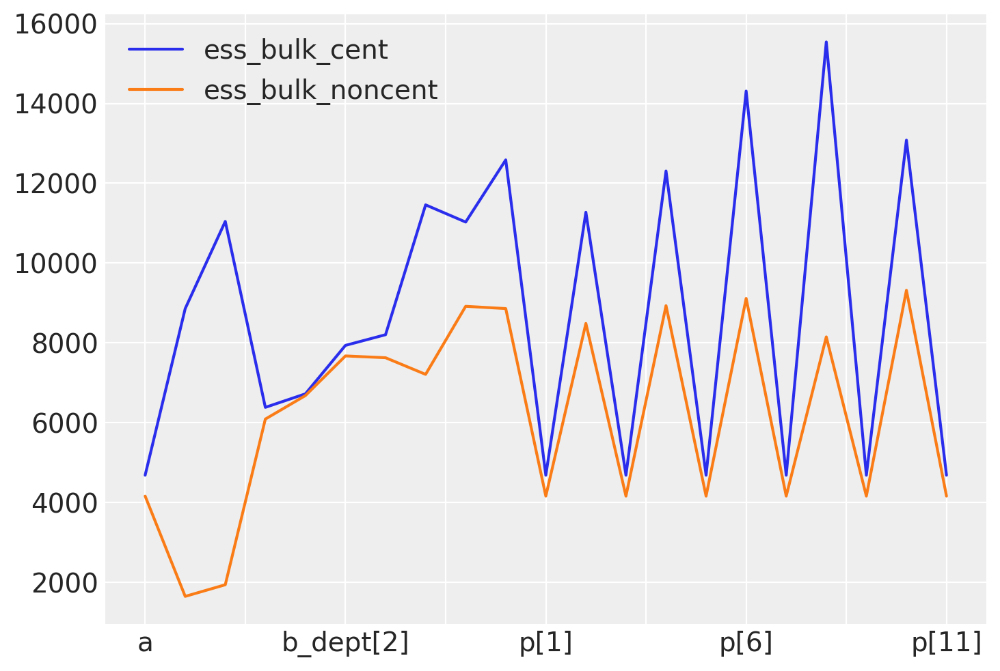

In [139]:
df_merged[['ess_bulk_cent', 'ess_bulk_noncent']].plot()

I can see that centered sampled faster and has more effective sample size

There are enough departments, each with many observations (admissions data), and varying slopes that are reasonably informed by data and this case centered version is better.

14M4.  Use WAIC to compare the Gaussian process model of Oceanic tools to the models fit to the same data in Chapter 11. Pay special attention to the effective numbers of parameters, as estimated by WAIC.

In [ ]:
pm.waic(trace_14_8)

In [144]:
dk = pd.read_csv("Data/Kline", sep=";")
P = standardize(np.log(dk.population)).values
c_id = (dk.contact == "high").astype(int).values

In [146]:
with pm.Model() as m11_10:
    a = pm.Normal("a", 3.0, 0.5, shape=2)
    b = pm.Normal("b", 0.0, 0.2, shape=2)

    cid = pm.intX(pm.Data("cid", c_id))
    P_ = pm.Data("P", P)
    lam = pm.math.exp(a[cid] + b[cid] * P_)

    T = pm.Poisson("total_tools", lam, observed=dk.total_tools)
    trace_11_10 = pm.sample(tune=3000, random_seed=RANDOM_SEED,  idata_kwargs={"log_likelihood": True})

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b]


Output()

Sampling 4 chains for 3_000 tune and 1_000 draw iterations (12_000 + 4_000 draws total) took 2 seconds.


In [147]:
az.waic(trace_11_10)

Computed from 4000 posterior samples and 10 observations log-likelihood matrix.

              Estimate       SE
deviance_waic    83.02    12.11
p_waic            5.83        -

There has been a warning during the calculation. Please check the results.

14M5.  Modify the phylogenetic distance example to use group size as the outcome and brain size as a predictor. Assuming brain size influences group size, what is your estimate of the effect? How does phylogeny influence the estimate?

In [148]:
Primates301 = pd.read_csv("Data/Primates301.csv", sep=";")
dpymc = Primates301.dropna(subset=["group_size", "body", "brain"])
spp_obs = dpymc["name"]

N_spp = len(dpymc)
M = standardize(np.log(dpymc.body.values))
B_ = standardize(np.log(dpymc.brain.values))
G = standardize(np.log(dpymc.group_size.values))
Imat = np.diag(np.ones(N_spp))

V = pd.read_csv("Data/Primates301_vcov_matrix.csv", index_col=0)
Dmat = pd.read_csv("Data/Primates301_distance_matrix.csv", index_col=0)

# put species in right order
V_ord = V.loc[spp_obs, spp_obs]
# convert to correlation matrix
R = (V_ord / V_ord.max()).values

# scale and reorder distance matrix
Dmat_ord = (Dmat.loc[spp_obs, spp_obs] / Dmat.loc[spp_obs, spp_obs].max()).values

In [151]:
class LinearMean:
    def __init__(self, intercept, slope):
        self.intercept = intercept
        self.slope = slope

    def __call__(self, X):
        return self.intercept + self.slope * B_

In [152]:
with pm.Model() as m14_11_group_size:
    a = pm.Normal("a", 0.0, 1.0)
    b = pm.Normal("b", 0.0, 0.5)

    mu = LinearMean(intercept=a, slope=b)

    etasq = pm.Exponential("etasq", 1.0)
    rhosq = pm.Normal("rhosq", 3.0, 0.25)

    SIGMA = etasq * pm.gp.cov.Exponential(input_dim=1, ls=rhosq)

    gp = pm.gp.Marginal(mean_func=mu, cov_func=SIGMA)

    sigma = pm.Exponential("sigma", 1.0)

    G = gp.marginal_likelihood("G", X=Dmat_ord, y=G, noise=sigma)

    trace_m14_11_group_size = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=RANDOM_SEED)

# b0 is bM and b1 is bG
az.summary(trace_m14_11_group_size, round_to=2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, etasq, rhosq, sigma]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 45 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.03,0.87,-1.42,1.38,0.01,0.01,9376.09,6666.89,1.0
b,0.50,0.08,0.37,0.62,0.00,0.00,8941.37,5870.81,1.0
rhosq,2.92,0.25,2.53,3.33,0.00,0.00,8662.27,6552.83,1.0
etasq,4.06,1.48,1.84,6.23,0.02,0.02,9266.52,5758.01,1.0
sigma,0.57,0.03,0.51,0.62,0.00,0.00,8626.89,6321.93,1.0


Yes, brain size positively and strongly influences group size, with a slope estimate of ~0.5. Phylogenetic structure (via GP) is accounted for, and the effect remains statistically and practically significant.

The GP kernel parameters suggest that phylogenetic correlation still matters, but the brain effect remains strong even after controlling for it:

| Parameter | Meaning                                 | Value                                         |
|-----------|------------------------------------------|-----------------------------------------------|
| rhosq     | GP lengthscale                          | 2.92 → moderately smooth spatial/phylogenetic structure |
| etasq     | GP variance                             | 4.06 → substantial phylogenetic variation     |
| sigma     | Observation noise                       | 0.57 → relatively small residual error        |

This tells us:

- Phylogeny explains some residual variation in group size.
- But even after accounting for that, **brain size still robustly predicts group size**.


14H1.  Let’s revisit the Bangladesh fertility data, data(bangladesh), from the practice problems for Chapter 13. Fit a model with both varying intercepts by district_id and varying slopes of urban by district_id. You are still predicting use.contraception. Inspect the correlation between the intercepts and slopes. Can you interpret this correlation, in terms of what it tells you about the pattern of contraceptive use in the sample? It might help to plot the mean (or median) varying effect estimates for both the intercepts and slopes, by district. Then you can visualize the correlation and maybe more easily think through what it means to have a particular correlation. Plotting predicted proportion of women using contraception, with urban women on one axis and rural on the other, might also help.

In [153]:
df_bangl=pd.read_csv('End_of_chapter_problems/data/bangladesh.csv', sep=';')
df_bangl.shape

(1934, 6)

In [154]:
df_bangl['use.contraception'].value_counts()

use.contraception
0    1175
1     759
Name: count, dtype: int64

In [157]:
df_bangl.urban.value_counts()

urban
0    1372
1     562
Name: count, dtype: int64

In [155]:
df_bangl['distric_idx']=pd.Categorical(df_bangl.district).codes

In [162]:
with pm.Model() as m_bangl_v2:

    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
    "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
        )
    a = pm.Normal("a", 0.0, 1.0)  # prior for average intercept
    b = pm.Normal("b", 0.0, 1.0)  # prior for average slope

    ab_dist = pm.MvNormal(
        "ab_dist", mu=at.stack([a, b]), chol=chol, shape=(df_bangl['distric_idx'].nunique(), 2))  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe

    district_idx = pm.Data("district_idx", df_bangl["distric_idx"].values)
    urban = pm.Data("urban", df_bangl["urban"].values)
    mu = ab_dist[district_idx, 0] + ab_dist[district_idx, 1] * urban

    p = pm.math.sigmoid(mu)
    use_contraception = pm.Bernoulli("use_contraception", p=p, observed=df_bangl['use.contraception'].values)
    trace_m_bangl_v2 = pm.sample(random_seed=RANDOM_SEED, idata_kwargs={"log_likelihood": True})

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_dist]


Output()

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/pytensor/compile/function/types.py:1039: RuntimeWarning: invalid value encountered in accumulate
  outputs = vm() if output_subset is None else vm(output_subset=output_subset)


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.
There were 9 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [164]:
az.summary(trace_m_bangl_v2).head(20)

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.703,0.101,-0.866,-0.545,0.002,0.002,2361.0,2867.0,1.00
b,0.693,0.170,0.432,0.968,0.004,0.003,2060.0,2578.0,1.00
"ab_dist[0, 0]",-1.539,0.313,-2.033,-1.057,0.005,0.005,3537.0,2991.0,1.00
"ab_dist[0, 1]",1.066,0.389,0.406,1.650,0.006,0.006,3744.0,2833.0,1.00
"ab_dist[1, 0]",-0.667,0.356,-1.217,-0.103,0.006,0.006,3576.0,2967.0,1.00
"ab_dist[1, 1]",0.658,0.678,-0.409,1.712,0.010,0.013,4888.0,2894.0,1.00
"ab_dist[2, 0]",-0.670,0.595,-1.559,0.305,0.009,0.012,4163.0,2622.0,1.00
"ab_dist[2, 1]",0.958,0.820,-0.458,2.157,0.014,0.017,3478.0,2300.0,1.00
"ab_dist[3, 0]",-0.856,0.386,-1.442,-0.229,0.007,0.007,3006.0,2523.0,1.01
"ab_dist[3, 1]",1.612,0.643,0.592,2.632,0.018,0.009,1253.0,2492.0,1.00


In [170]:
trace_m_bangl_v2.posterior['ab_dist'][:0]

<xarray.DataArray 'ab_dist' (chain: 0, draw: 1000, ab_dist_dim_0: 60,
                             ab_dist_dim_1: 2)> Size: 0B
array([], shape=(0, 1000, 60, 2), dtype=float64)
Coordinates:
  * chain          (chain) int64 0B 
  * draw           (draw) int64 8kB 0 1 2 3 4 5 6 ... 994 995 996 997 998 999
  * ab_dist_dim_0  (ab_dist_dim_0) int64 480B 0 1 2 3 4 5 ... 54 55 56 57 58 59
  * ab_dist_dim_1  (ab_dist_dim_1) int64 16B 0 1

In [180]:
ab_median = ab_samples.median(dim=["chain", "draw"])
intercepts = ab_median[:, 0].values
slopes = ab_median[:, 1].values

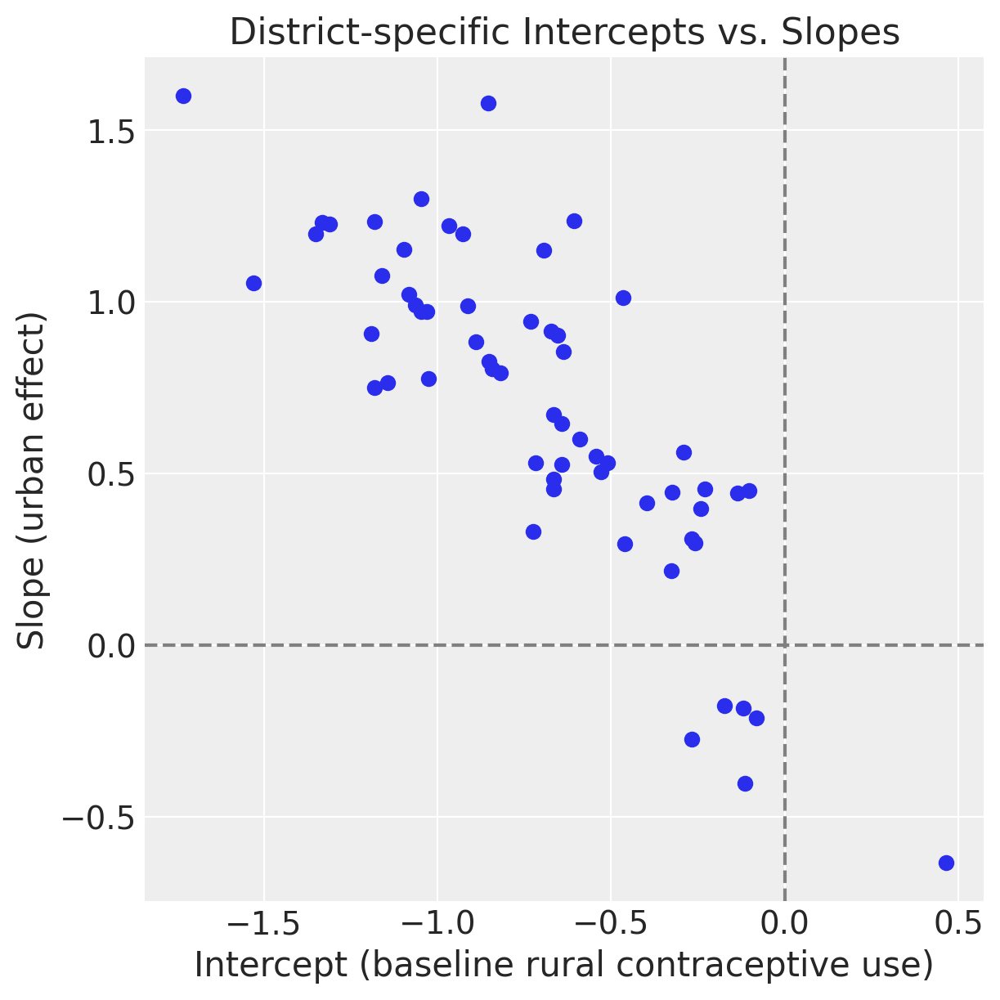

In [181]:
plt.figure(figsize=(6, 6))
plt.scatter(intercepts, slopes)
plt.xlabel("Intercept (baseline rural contraceptive use)")
plt.ylabel("Slope (urban effect)")
plt.title("District-specific Intercepts vs. Slopes")
plt.grid(True)
plt.axhline(0, ls="--", color="gray")
plt.axvline(0, ls="--", color="gray")
plt.show()

In [182]:
correlation = np.corrcoef(intercepts, slopes)[0, 1]
print("Correlation between intercepts and slopes:", correlation)

Correlation between intercepts and slopes: -0.8270198741489144


In [196]:
from scipy.special import expit
p_rural = expit(intercepts)               # urban = 0
p_urban = expit(intercepts + slopes)      # urban = 1

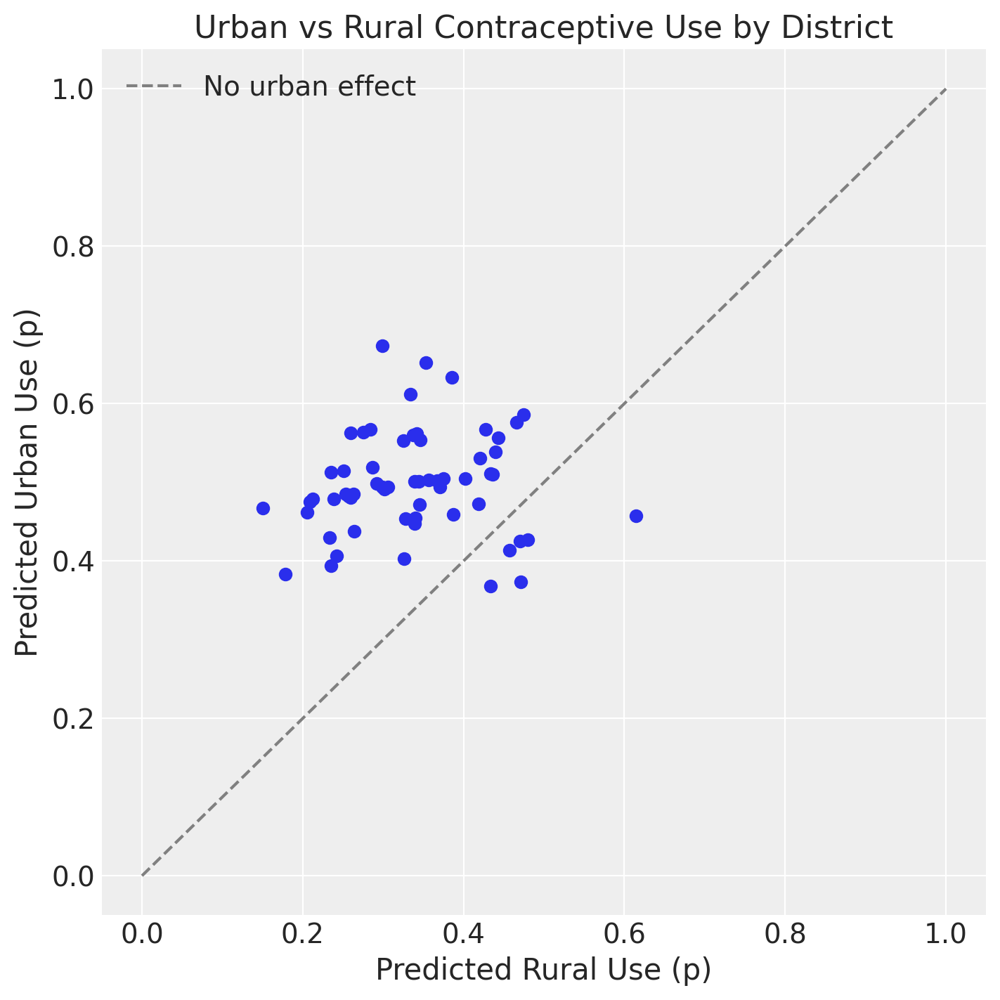

In [197]:
plt.figure(figsize=(7, 7))
plt.scatter(p_rural, p_urban)
plt.plot([0, 1], [0, 1], "--", color="gray", label="No urban effect")

plt.xlabel("Predicted Rural Use (p)")
plt.ylabel("Predicted Urban Use (p)")
plt.title("Urban vs Rural Contraceptive Use by District")
plt.grid(True)
plt.legend()
plt.show()

<Axes: xlabel='district'>

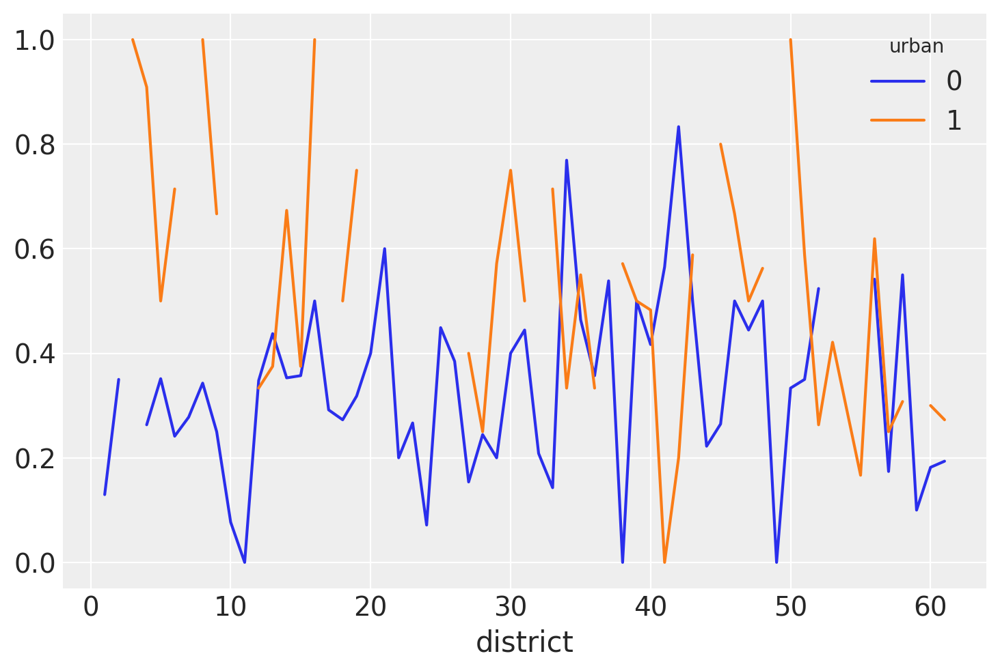

In [198]:
df_bangl_dist_grp=df_bangl.groupby(["district", "urban"])["use.contraception"].mean()
df_bangl_dist_grp.unstack().plot()

The lower the rural contraceptive use in a district, the larger the urban–rural gap.
And districts with high rural use tend to show less difference between urban and rural. The more rural a district is (in terms of low rural contraceptive use), the greater the gap between rural and urban women.

14H2.  Now consider the predictor variables age.centered and living.children, also contained in data(bangladesh). Suppose that age influences contraceptive use (changing attitudes) and number of children (older people have had more time to have kids). Number of children may also directly influence contraceptive use. Draw a DAG that reflects these hypothetical relationships. Then build models needed to evaluate the DAG. You will need at least two models. Retain district and urban, as in 14H1. What do you conclude about the causal influence of age and children?

In [199]:
df_bangl

,woman,district,use.contraception,living.children,age.centered,urban,distric_idx
0,1,1,0,4,18.4400,1,0
1,2,1,0,1,-5.5599,1,0
2,3,1,0,3,1.4400,1,0
3,4,1,0,4,8.4400,1,0
4,5,1,0,1,-13.5590,1,0
...,...,...,...,...,...,...,...
1929,1930,61,0,4,14.4400,0,59
1930,1931,61,0,3,-4.5599,0,59
1931,1932,61,0,4,14.4400,0,59
1932,1933,61,0,1,-13.5600,0,59


In [200]:
with pm.Model() as m_age_contr:

    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
    "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
        )
    a = pm.Normal("a", 0.0, 1.0)  # prior for average intercept
    b = pm.Normal("b", 0.0, 1.0)  # prior for average slope
    
    ab_dist = pm.MvNormal(
        "ab_dist", mu=at.stack([a, b]), chol=chol, shape=(df_bangl['distric_idx'].nunique(), 2))  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe
    b_age=pm.Normal("b_age", 0, 1.0)

    district_idx = pm.Data("district_idx", df_bangl["distric_idx"].values)
    urban = pm.Data("urban", df_bangl["urban"].values)
    age = pm.Data("age", df_bangl["age.centered"].values)
    mu = ab_dist[district_idx, 0] + ab_dist[district_idx, 1] * urban + b_age*age

    p = pm.math.sigmoid(mu)
    use_contraception = pm.Bernoulli("use_contraception", p=p, observed=df_bangl['use.contraception'].values)
    trace_m_age_contr = pm.sample(random_seed=RANDOM_SEED, idata_kwargs={"log_likelihood": True})

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_dist, b_age]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.
There were 6 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [207]:
az.summary(trace_m_age_contr, var_names=['a', 'b', 'b_age', 'chol_cov'])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.705,0.101,-0.857,-0.537,0.002,0.002,1780.0,1417.0,1.00
b,0.691,0.173,0.393,0.951,0.005,0.003,1233.0,1233.0,1.00
b_age,0.009,0.006,-0.001,0.018,0.000,0.000,4521.0,2805.0,1.00
chol_cov[0],0.581,0.096,0.432,0.729,0.003,0.002,876.0,1940.0,1.00
chol_cov[1],-0.521,0.205,-0.841,-0.190,0.008,0.004,722.0,1043.0,1.00
chol_cov[2],0.563,0.167,0.304,0.833,0.011,0.006,207.0,147.0,1.02


In [203]:
with pm.Model() as m_age_numchild_contr:

    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
    "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
        )
    a = pm.Normal("a", 0.0, 1.0)  # prior for average intercept
    b = pm.Normal("b", 0.0, 1.0)  # prior for average slope
    
    ab_dist = pm.MvNormal(
        "ab_dist", mu=at.stack([a, b]), chol=chol, shape=(df_bangl['distric_idx'].nunique(), 2))  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe
    b_age=pm.Normal("b_age", 0, 1.0)
    b_numchild=pm.Normal("b_child", 0, 1.0)

    district_idx = pm.Data("district_idx", df_bangl["distric_idx"].values)
    urban = pm.Data("urban", df_bangl["urban"].values)
    age = pm.Data("age", df_bangl["age.centered"].values)
    children = pm.Data("children", df_bangl["living.children"].values)
    mu = ab_dist[district_idx, 0] + ab_dist[district_idx, 1] * urban + b_age*age + b_numchild*children

    p = pm.math.sigmoid(mu)
    use_contraception = pm.Bernoulli("use_contraception", p=p, observed=df_bangl['use.contraception'].values)
    trace_m_age_numchild_contr = pm.sample(random_seed=RANDOM_SEED, idata_kwargs={"log_likelihood": True})

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_dist, b_age, b_child]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [206]:
az.summary(trace_m_age_numchild_contr, var_names=['a', 'b', 'b_age','b_child','chol_cov'])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-1.806,0.187,-2.084,-1.502,0.006,0.004,1018.0,1920.0,1.00
b,0.739,0.168,0.486,1.017,0.004,0.003,2176.0,2328.0,1.00
b_age,-0.029,0.008,-0.042,-0.018,0.000,0.000,1624.0,2374.0,1.00
b_child,0.408,0.057,0.309,0.491,0.002,0.001,1013.0,1493.0,1.00
chol_cov[0],0.608,0.101,0.447,0.767,0.003,0.002,1427.0,1924.0,1.00
chol_cov[1],-0.510,0.202,-0.834,-0.203,0.008,0.004,712.0,1257.0,1.00
chol_cov[2],0.570,0.157,0.317,0.800,0.008,0.004,382.0,832.0,1.01


The apparent (weakly positive) effect of age in Model 1 is confounded by number of children. Once you control for children (in Model 2), age shows a negative direct effect: older individuals use contraception less.
Meanwhile, having more children increases contraceptive use, likely reflecting a desire to stop having more children after a certain family size.

14H3.  Modify any models from 14H2 that contained that children variable and model the variable now as a monotonic ordered category, like education from the week we did ordered categories. Education in that example had 8 categories. Children here will have fewer (no one in the sample had 8 children). So modify the code appropriately. What do you conclude about the causal influence of each additional child on use of contraception?

In [208]:
df_bangl["children_idx"] = df_bangl["living.children"].astype("int")
n_children_levels = df_bangl["children_idx"].max() + 1

In [214]:
int(n_children_levels)

5

In [215]:
with pm.Model() as m_bangl_14h3:

    # Varying intercepts and slopes (from 14H2)
    a = pm.Normal("a", 0.0, 1.0)
    b = pm.Normal("b", 0.0, 1.0)

    chol, Rho_, sigma_district = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2,
        sd_dist=pm.Exponential.dist(1.0),
        compute_corr=True,
    )

    ab_district = pm.MvNormal(
        "ab_district", mu=at.stack([a, b]), chol=chol, shape=(df_bangl["distric_idx"].nunique(), 2)
    )

    # Predictors
    district_idx = pm.Data("district_idx", df_bangl["distric_idx"].values)
    urban = pm.Data("urban", df_bangl["urban"].values)
    age = pm.Data("age_centered", df_bangl["age.centered"].values)
    child_idx = pm.Data("children_idx", df_bangl["children_idx"].values)

    # Age slope
    b_age = pm.Normal("b_age", 0.0, 0.5)

    # Monotonic effect of number of children
    child_base = pm.Normal("child_base", 0, 1, shape=int(n_children_levels - 1))
    child_effect = at.concatenate([[0], at.cumsum(child_base)])

    # Linear predictor
    mu = (
        ab_district[district_idx, 0] +
        ab_district[district_idx, 1] * urban +
        b_age * age +
        child_effect[child_idx]
    )

    p = pm.Deterministic("p", pm.math.sigmoid(mu))

    y = pm.Bernoulli("use_contraception", p=p, observed=df_bangl["use.contraception"].values)

    trace_14h3 = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=42)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, chol_cov, ab_district, b_age, child_base]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 117 seconds.
There were 11 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [218]:
az.summary(trace_14h3,var_names=['a', 'b', 'child_base'])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.768,0.724,-1.936,0.337,0.041,0.024,310.0,538.0,1.01
b,0.767,0.169,0.496,1.030,0.003,0.002,4092.0,4639.0,1.00
child_base[0],-0.904,0.724,-2.068,0.209,0.041,0.023,314.0,549.0,1.01
child_base[1],1.091,0.158,0.841,1.339,0.002,0.002,9120.0,5648.0,1.00
child_base[2],0.249,0.165,-0.010,0.512,0.002,0.002,8403.0,6442.0,1.00
child_base[3],-0.016,0.156,-0.256,0.243,0.002,0.002,7463.0,5634.0,1.00


In [221]:
# Cumulative log-odds per number of children
child_effect_mean = trace_14h3.posterior["child_base"].mean(dim=["chain", "draw"]).values

for i in range(len(child_effect_mean) - 1):
    p1 = expit(child_effect_mean[i])     # probability with i children
    p2 = expit(child_effect_mean[i + 1]) # probability with i+1 children
    delta = p2 - p1
    print(f"Going from {i} to {i+1} children: {delta:.3f} in probability")

Going from 0 to 1 children: 0.461 in probability
Going from 1 to 2 children: -0.187 in probability
Going from 2 to 3 children: -0.066 in probability


- The effect of number of children on contraceptive use is **not linear**.
- The **only strongly supported increase** occurs when moving from **1 to 2 children**.
- After that, the estimated effect levels off and includes 0 — suggesting **no significant boost in use from additional children**.
- This pattern may reflect a **threshold**, where people consider contraception more seriously after reaching 2 children.

14H4.  Varying effects models are useful for modeling time series, as well as spatial clustering. In a time series, the observations cluster by entities that have continuity through time, such as individuals. Since observations within individuals are likely highly correlated, the multilevel structure can help quite a lot. You’ll use the data in data(Oxboys), which is 234 height measurements on 26 boys from an Oxford Boys Club (I think these were like youth athletic leagues?), at 9 different ages (centered and standardized) per boy. You’ll be interested in predicting height, using age, clustered by Subject (individual boy). Fit a model with varying intercepts and slopes (on age), clustered by Subject. Present and interpret the parameter estimates. Which varying effect contributes more variation to the heights, the intercept or the slope?

In [225]:
df_ox=pd.read_csv('End_of_chapter_problems/data/Oxboys.csv', sep=";")
df_ox.shape

(234, 4)

In [226]:
df_ox.head()

,Subject,age,height,Occasion
0,1,-1.0000,140.5,1
1,1,-0.7479,143.4,2
2,1,-0.4630,144.8,3
3,1,-0.1643,147.1,4
4,1,-0.0027,147.7,5


In [253]:
df_ox['height_std']=standardize(df_ox.height)

In [229]:
df_ox['subject_idx']=pd.Categorical(df_ox.Subject).codes

<Axes: >

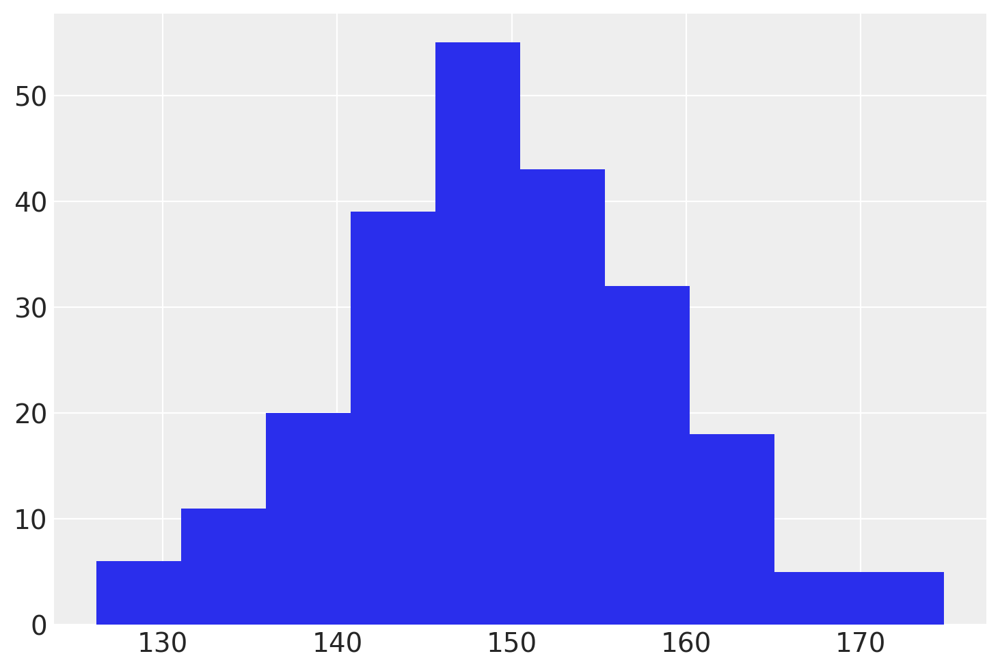

In [227]:
df_ox.height.hist()

In [254]:
with pm.Model() as m_ox:
    # LKJCholeskyCov is more efficient than LKJCorr
    # PyMC >= 3.9 extracts the stds and matrix of correlations automatically for us
    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
    )

    a = pm.Normal("a", 0.0, 1.0)  # prior for average intercept
    b = pm.Normal("b", 0.0, 0.5)  # prior for average slope
    ab_subject = pm.MvNormal(
        "ab_subject", mu=at.stack([a, b]), chol=chol, shape=(df_ox.subject_idx.nunique(), 2)
    )  # population of varying effects

    mu = ab_subject[df_ox.subject_idx.values, 0] + ab_subject[df_ox.subject_idx.values, 1] * df_ox["age"].values  # linear model
    sigma_within = pm.Exponential("sigma_within", 1.0)  # prior stddev within subjets

    height = pm.Normal("height", mu=mu, sigma=sigma_within, observed=df_ox["height_std"].values)  # likelihood

    trace_m_ox = pm.sample(4000, tune=4000, target_accept=0.9)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_subject, sigma_within]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 29 seconds.


In [255]:
az.summary(trace_m_ox)

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.023,0.175,-0.294,0.259,0.001,0.001,20704.0,13005.0,1.0
b,0.713,0.038,0.652,0.772,0.000,0.000,20730.0,12056.0,1.0
"ab_subject[0, 0]",-0.153,0.024,-0.192,-0.115,0.000,0.000,29875.0,10960.0,1.0
"ab_subject[0, 1]",0.783,0.037,0.724,0.842,0.000,0.000,27418.0,11380.0,1.0
"ab_subject[1, 0]",-0.731,0.025,-0.771,-0.692,0.000,0.000,27298.0,12029.0,1.0
...,...,...,...,...,...,...,...,...,...
"chol_cov_corr[0, 1]",0.562,0.136,0.356,0.774,0.001,0.001,20961.0,13021.0,1.0
"chol_cov_corr[1, 0]",0.562,0.136,0.356,0.774,0.001,0.001,20961.0,13021.0,1.0
"chol_cov_corr[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,15890.0,16000.0,1.0
chol_cov_stds[0],0.908,0.132,0.702,1.101,0.001,0.001,22050.0,10488.0,1.0


In [256]:
az.summary(trace_m_ox, var_names=['a', 'b'])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.023,0.175,-0.294,0.259,0.001,0.001,20704.0,13005.0,1.0
b,0.713,0.038,0.652,0.772,0.000,0.000,20730.0,12056.0,1.0


In [257]:
df_ab=az.summary(trace_m_ox, var_names=['ab_subject'])
intercepts = df_ab[df_ab.index.str.endswith("0]")]
slopes = df_ab[df_ab.index.str.endswith("1]")]

<Axes: >

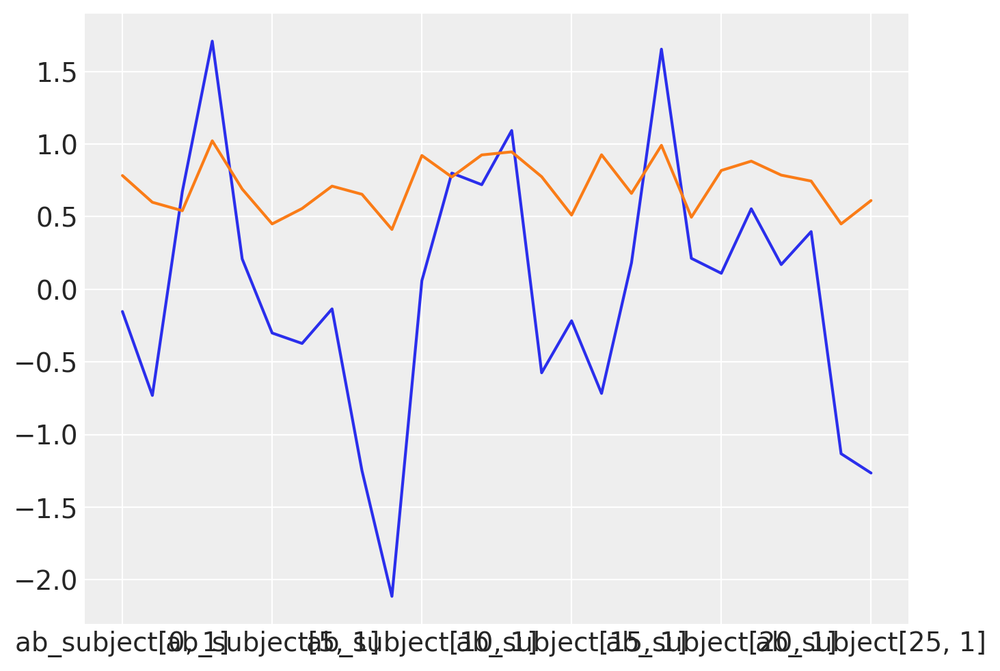

In [260]:
intercepts['mean'].plot()
slopes['mean'].plot()

<Axes: >

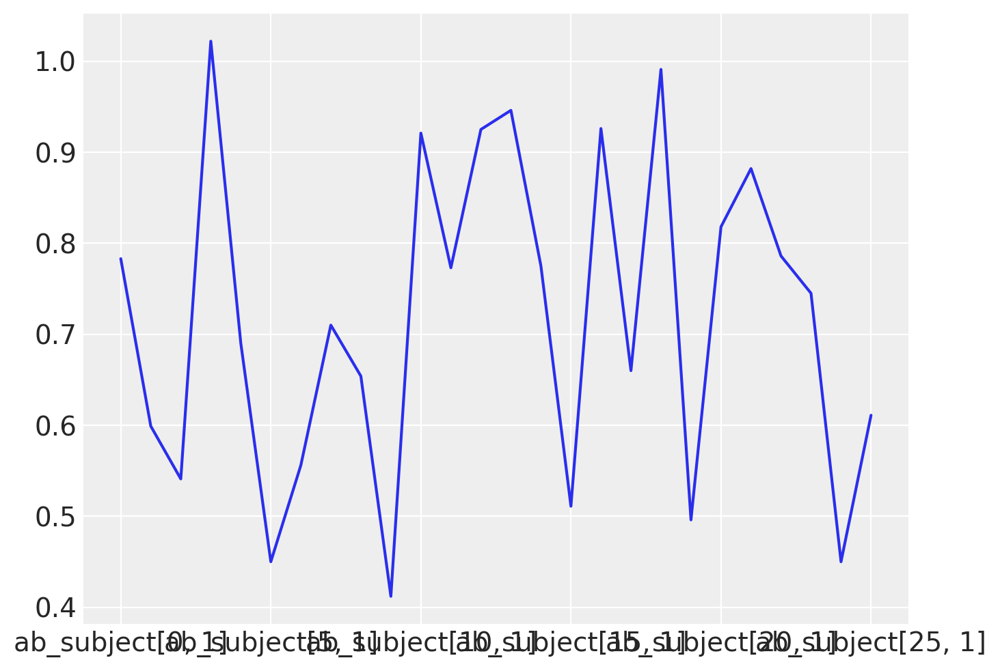

In [259]:
slopes['mean'].plot()

The variance in intercepts is larger than the variance in slopes, indicating that individual baseline heights differ more than their rates of growth. In this sample, boys vary more in how tall they are on average than in how fast they grow over time.

14H5.  Now consider the correlation between the varying intercepts and slopes. Can you explain its value? How would this estimated correlation influence your predictions about a new sample of boys?

In [267]:
az.summary(trace_m_ox, var_names=['chol_cov_corr'])

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"chol_cov_corr[0, 0]",1.000,0.000,1.000,1.000,0.000,NaN,16000.0,16000.0,NaN
"chol_cov_corr[0, 1]",0.562,0.136,0.356,0.774,0.001,0.001,20961.0,13021.0,1.0
"chol_cov_corr[1, 0]",0.562,0.136,0.356,0.774,0.001,0.001,20961.0,13021.0,1.0
"chol_cov_corr[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,15890.0,16000.0,1.0


correlation between intercept and slope is on average 0.562. Which means that taller people tend to have bigger age effect in their height. Boys who are taller at the beginning of the study (higher intercepts) tend to grow faster (steeper slopes).

14H6.  Use mvrnorm (in library(MASS)) or rmvnorm (in library(mvtnorm)) to simulate a new sample of boys, based upon the posterior mean values of the parameters. That is, try to simulate varying intercepts and slopes, using the relevant parameter estimates, and then plot the predicted trends of height on age, one trend for each simulated boy you produce. A sample of 10 simulated boys is plenty, to illustrate the lesson. You can ignore uncertainty in the posterior, just to make the problem a little easier. But if you want to include the uncertainty about the parameters, go for it. Note that you can construct an arbitrary variance-covariance matrix to pass to either mvrnorm or rmvnorm with something like:

R code 14.54

S <- matrix( c( sa^2 , sa*sb*rho , sa*sb*rho , sb^2 ) , nrow=2 )

where sa is the standard deviation of the first variable, sb is the standard deviation of the second variable, and rho is the correlation between them.

In [269]:
az.summary(trace_m_ox, var_names=['a', 'b', 'chol_cov_corr'])

/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/mnt/c/Users/risto/projects/pymc-resources/.venv/lib/python3.12/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.023,0.175,-0.294,0.259,0.001,0.001,20704.0,13005.0,1.0
b,0.713,0.038,0.652,0.772,0.000,0.000,20730.0,12056.0,1.0
"chol_cov_corr[0, 0]",1.000,0.000,1.000,1.000,0.000,NaN,16000.0,16000.0,NaN
"chol_cov_corr[0, 1]",0.562,0.136,0.356,0.774,0.001,0.001,20961.0,13021.0,1.0
"chol_cov_corr[1, 0]",0.562,0.136,0.356,0.774,0.001,0.001,20961.0,13021.0,1.0
"chol_cov_corr[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,15890.0,16000.0,1.0


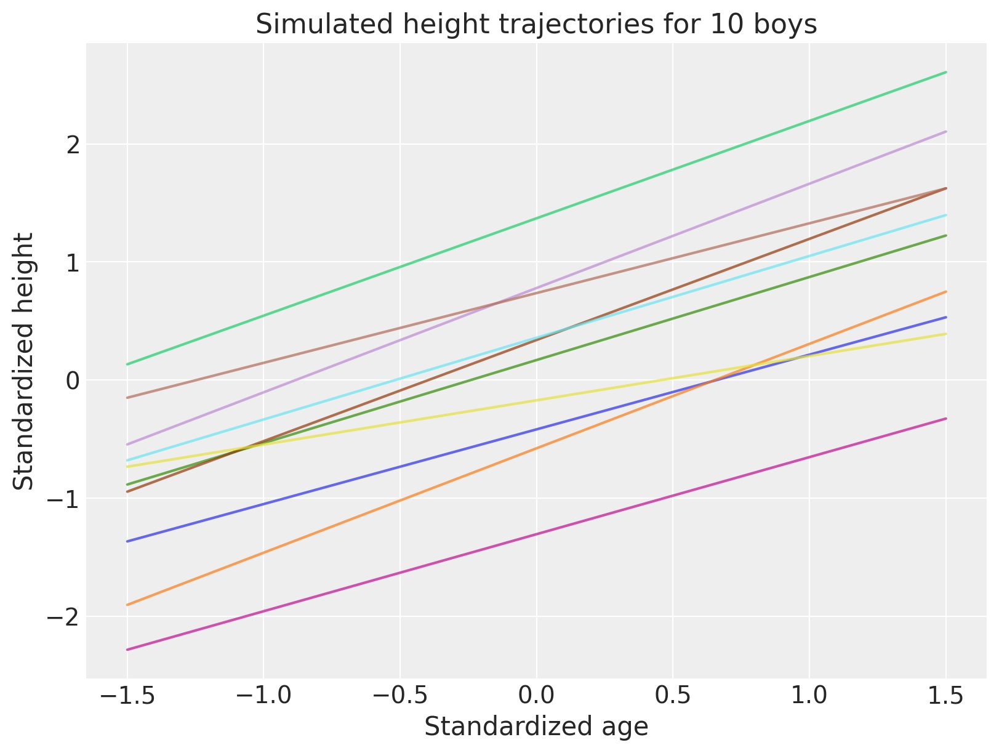

In [274]:
# Values from posterior summary (replace with actual summary values)
a_mean = -0.023
b_mean = 0.713
sa = 0.8   # std dev of intercepts (e.g., sigma_subject[0])
sb = 0.2   # std dev of slopes (e.g., sigma_subject[1])
rho = 0.562

# Covariance matrix
S = np.array([
    [sa**2, sa * sb * rho],
    [sa * sb * rho, sb**2]
])

# Simulate 10 random intercept-slope pairs
samples = multivariate_normal.rvs(mean=[a_mean, b_mean], cov=S, size=10, random_state=42)

# Plot predicted height curves for simulated boys
age_range = np.linspace(-1.5, 1.5, 100)  # assuming age is standardized

plt.figure(figsize=(8, 6))
for i in range(10):
    intercept, slope = samples[i]
    height_pred = intercept + slope * age_range
    plt.plot(age_range, height_pred, label=f"boy {i+1}", alpha=0.7)

plt.xlabel("Standardized age")
plt.ylabel("Standardized height")
plt.title("Simulated height trajectories for 10 boys")
plt.grid(True)
plt.show()